# Rainfall Weather Forecasting

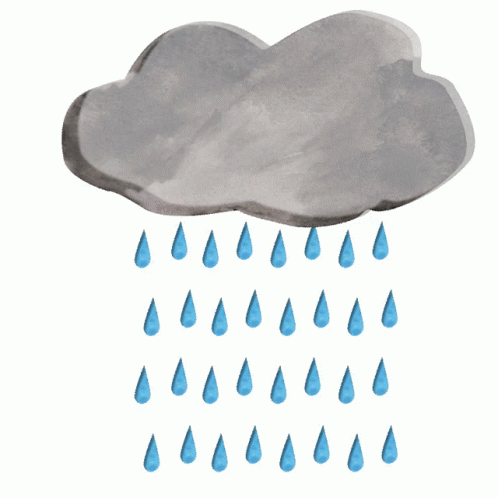

### Project Description

###### 1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


### Dataset Description:
Number of columns: 23


### Dataset Link-  

### •	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
•	https://github.com/dsrscientist/dataset3


# Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

# Uploading and reading the dataset

In [2]:
rain=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")

# Lets read the first five rows of our data set.

In [3]:
rain.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Lets read the last five rows of our data set.

In [4]:
rain.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# Lets check the shape of rain dataset

In [5]:
rain.shape

(8425, 23)

# Lets check the information about rain dataset(datatype and memory used)

In [6]:
rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

## Rain dataset has a 22 columns, 16 columns are numerical(float) and 7 are categorical.

# Lets check the missing and duplicate values in the rain dataset

### Rain data set has 1663 duplicate values.

In [7]:
rain.drop_duplicates(keep= 'first',inplace= True )

In [8]:
rain.duplicated().sum()

0

The dataset is free from duplicates.

## Almost all the columns have the missing values in the dataset.

## Lets check the nunique, unique and valu counts in our data set

In [9]:
rain.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

# Descriptive Statistics

In [10]:
rain.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6692.000000,6705.000000,6624.000000,3841.000000,3526.000000,5820.000000,6699.000000,6662.000000,6708.000000,6666.000000,5454.000000,5451.000000,4896.000000,4860.000000,6711.000000,6670.000000
mean,13.109145,24.098345,2.780148,5.302395,7.890896,38.977663,12.782206,17.571150,67.506559,50.467147,1017.626311,1015.119923,4.336806,4.320988,17.895038,22.708561
std,5.569574,6.156128,10.591418,4.436790,3.785883,14.418577,9.833499,9.620043,17.251733,18.631086,6.712043,6.646755,2.908324,2.740519,5.744117,6.012896
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.500000,0.000000,2.600000,5.400000,30.000000,6.000000,9.000000,56.000000,38.000000,1013.100000,1010.300000,1.000000,1.000000,13.800000,18.300000
50%,13.200000,23.500000,0.000000,4.600000,9.000000,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000
75%,17.500000,28.400000,0.800000,7.000000,10.800000,48.000000,19.000000,24.000000,81.000000,63.000000,1022.200000,1019.600000,7.000000,7.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [11]:
rain.describe(include=object).T

,count,unique,top,freq
Date,6762,3004,2011-02-11,4
Location,6762,12,PerthAirport,1204
WindGustDir,5820,16,E,518
WindDir9am,5968,16,N,609
WindDir3pm,6468,16,SE,677
RainToday,6624,2,No,5052
RainTomorrow,6624,2,No,5052


In [12]:
rain['Date'] = pd.to_datetime(rain['Date'])
rain['Year'] = rain['Date'].dt.year
rain['Month'] = rain['Date'].dt.month
rain['Day'] = rain['Date'].dt.day

In [13]:
rain.drop('Date',axis=1,inplace=True)


In [14]:
rain.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


## Differentiate Numarical and Categorical Data:

In [15]:
rain.columns.to_series().groupby(rain.dtypes).groups

{int64: ['Year', 'Month', 'Day'], float64: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'], object: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']}

In [16]:
num_features= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
                'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' ]
cat_features = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

In [17]:
rain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6692 non-null   float64
 2   MaxTemp        6705 non-null   float64
 3   Rainfall       6624 non-null   float64
 4   Evaporation    3841 non-null   float64
 5   Sunshine       3526 non-null   float64
 6   WindGustDir    5820 non-null   object 
 7   WindGustSpeed  5820 non-null   float64
 8   WindDir9am     5968 non-null   object 
 9   WindDir3pm     6468 non-null   object 
 10  WindSpeed9am   6699 non-null   float64
 11  WindSpeed3pm   6662 non-null   float64
 12  Humidity9am    6708 non-null   float64
 13  Humidity3pm    6666 non-null   float64
 14  Pressure9am    5454 non-null   float64
 15  Pressure3pm    5451 non-null   float64
 16  Cloud9am       4896 non-null   float64
 17  Cloud3pm       4860 non-null   float64
 18  Temp9am 

# Let check if any whitespace, 'NA' or '-' exist in dataset

In [18]:
rain.isin(['','NA','-']).sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

No blank space and NA value present the dataset.

# Checking null values in our dataset

In [19]:
rain.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
Year                0
Month               0
Day                 0
dtype: int64

### Creating a table with data missing

In [20]:
missing_values=rain.isnull().sum() # missing values

percent_missing = rain.isnull().sum()/rain.shape[0]*100 # missing value %

value = {
    'Missing_values ':missing_values,
    'Percent_missing %':percent_missing , 
     'Data type' : rain.dtypes
}
frame=pd.DataFrame(value)
frame

,Missing_values,Percent_missing %,Data type
Location,0,0.000000,object
MinTemp,70,1.035197,float64
MaxTemp,57,0.842946,float64
Rainfall,138,2.040816,float64
Evaporation,2921,43.197279,float64
Sunshine,3236,47.855664,float64
WindGustDir,942,13.930790,object
WindGustSpeed,942,13.930790,float64
WindDir9am,794,11.742088,object
WindDir3pm,294,4.347826,object


# Handling Null Values for Categorical Columns

In [21]:
cat=rain[['WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']]
for i in cat:
    print("Mode of ",i)
    mode=rain[i].mode()[0]
    print(mode)
    print("****************")

Mode of  WindGustDir
E
****************
Mode of  WindDir9am
N
****************
Mode of  WindDir3pm
SE
****************
Mode of  RainToday
No
****************
Mode of  RainTomorrow
No
****************


In [22]:
for i in cat:
    mode=rain[i].mode()[0]
    rain[i].fillna(mode,inplace=True)

# Handling Null Values for Numerical Columns

In [23]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
for i in num:
    print("Mean of ",i,'is')
    mean = rain[i].mean()
    print(mean)
    print("*************")

Mean of  MinTemp is
13.109145248057388
*************
Mean of  MaxTemp is
24.098344519015647
*************
Mean of  Rainfall is
2.780147946859921
*************
Mean of  Evaporation is
5.302395209580836
*************
Mean of  Sunshine is
7.8908961996596885
*************
Mean of  WindGustSpeed is
38.97766323024055
*************
Mean of  WindSpeed9am is
12.78220629944768
*************
Mean of  WindSpeed3pm is
17.571149804863403
*************
Mean of  Humidity9am is
67.50655933214072
*************
Mean of  Humidity3pm is
50.467146714671465
*************
Mean of  Pressure9am is
1017.6263109644285
*************
Mean of  Pressure3pm is
1015.1199229499142
*************
Mean of  Cloud9am is
4.336805555555555
*************
Mean of  Cloud3pm is
4.320987654320987
*************
Mean of  Temp9am is
17.895037997317864
*************
Mean of  Temp3pm is
22.708560719640197
*************


In [24]:
for i in num:
    mean=rain[i].mean()
    rain[i].fillna(mean,inplace=True)

In [25]:
rain.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

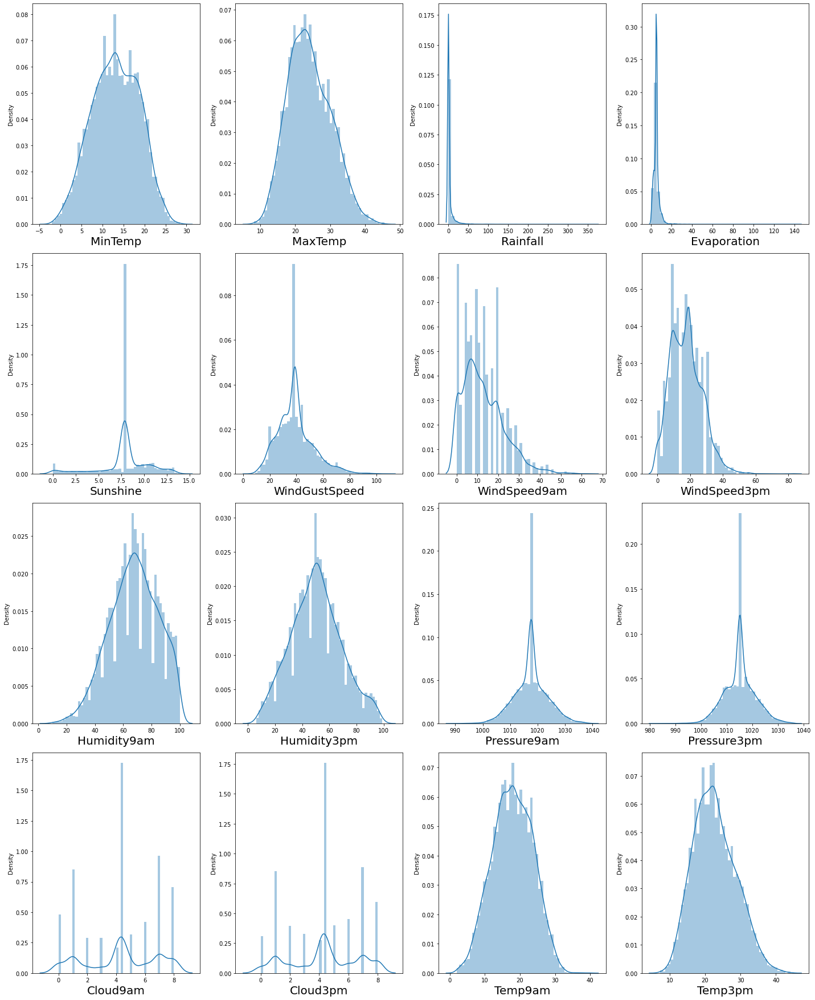

In [26]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,30))
for x in num:
    plt.subplot(5,4,i+1)
    sns.distplot(rain[x], bins=50)
    plt.xlabel(x,fontsize=20)
    i=i+1
plt.tight_layout()

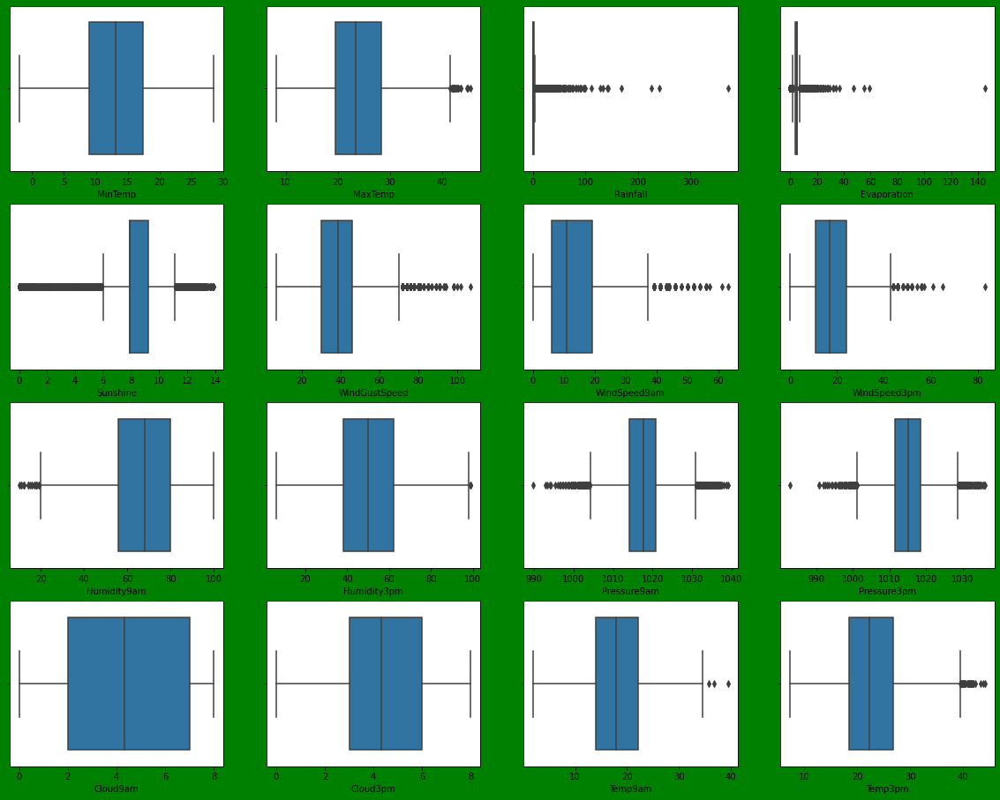

In [27]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
plt.figure(figsize=(20,20),facecolor='green')
plotnumber=1

for x in num:
    if plotnumber<=16:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(rain[x])
        plt.xlabel(x)
    plotnumber+=1
plt.show()

###### Rain dataset has outliers.

# Outliers Removal

## IQR Method

In [28]:
#1st quantile
q1= rain. quantile(0.1)
#3rd quantile
q3= rain. quantile(0.85)
#IQR
iqr= q3-q1

In [29]:
rain_new = rain[~((rain < (q1 - 1.5 *iqr)) |(rain > (q3 + 1.5 *iqr))).any(axis=1)]
print(rain_new.shape)

(6126, 25)


In [30]:
((rain.shape[0] - rain_new.shape[0])/rain.shape[0])*100

9.40550133096717

All outliers removed

# EDA(Exploratory Data Analysis):

## Categorical Data Analysis:

In [31]:
cat= ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']
for i in cat:
    x= rain_new[i].value_counts()
    print("Value counts of", i, "is---\n",x)
    print("="*20)

Value counts of Location is---
 PerthAirport    1104
Albury           838
Melbourne        748
Newcastle        744
CoffsHarbour     530
Williamtown      523
Brisbane         522
Penrith          445
Darwin           236
Wollongong       212
Adelaide         185
Uluru             39
Name: Location, dtype: int64
Value counts of WindGustDir is---
 E      1330
N       429
SW      410
W       394
WNW     358
WSW     356
SSE     343
ENE     339
S       333
SE      329
NE      283
NNE     273
SSW     268
NW      266
ESE     243
NNW     172
Name: WindGustDir, dtype: int64
Value counts of WindDir9am is---
 N      1294
SW      502
NW      427
SE      407
ENE     377
NE      339
WSW     326
E       321
NNE     320
SSW     316
S       283
SSE     280
WNW     264
W       263
ESE     207
NNW     200
Name: WindDir9am, dtype: int64
Value counts of WindDir3pm is---
 SE     869
NE     455
WSW    450
S      447
SW     389
SSE    369
NW     362
WNW    354
E      353
W      353
N      331
ESE    323
ENE  

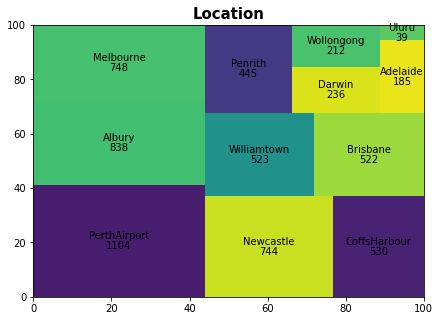

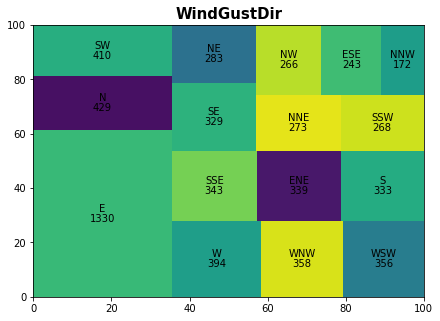

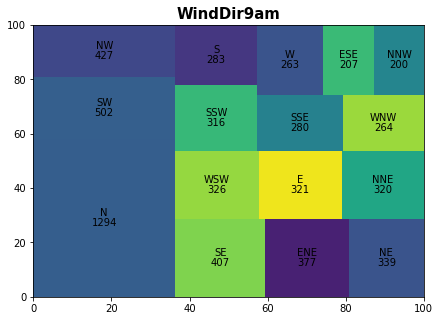

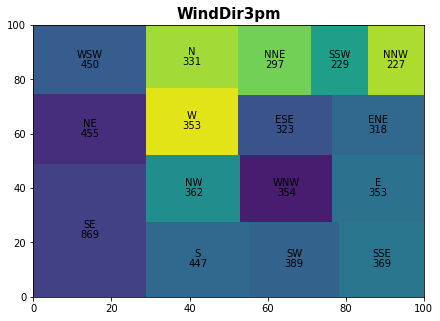

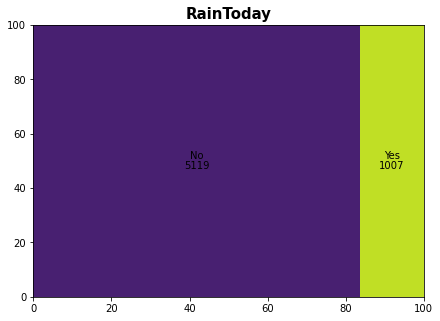

In [32]:
import squarify
for i in cat:
    plt.figure(figsize=(7,5))
    reln = rain_new[i].value_counts()
    squarify.plot(sizes=reln.values, value=reln.values, label=reln.index)
    plt.title(i, fontdict={'fontsize': 15, 'fontweight': 'bold'})
    plt.show()

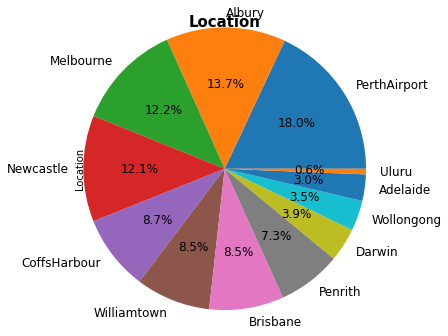

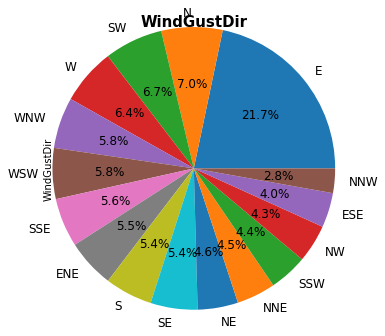

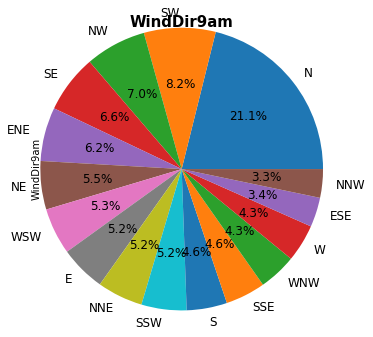

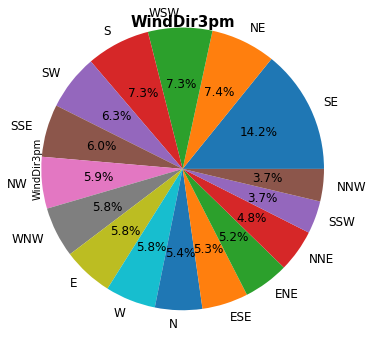

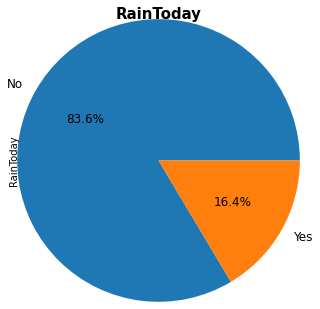

In [33]:
for i in cat:
    plt.figure(figsize=(5,5))
    rain_new[i].value_counts().plot.pie(radius =1.3, textprops ={ 'fontsize':12}, autopct='%2.1f%%')
    plt.title(i,fontsize=15,fontweight='bold')
    
    plt.show()

Around 18.1% location is PerthAirport.
Maximum WindGustDir is E that is the direction of the strongest wind gust in the 24 hours to midnight is East direction.
Around 21.2% WindDir9am is N (North).
Around 14.2% WindDir3pm is SE (South East).
RainToday has 'No' percentage 83.2%.

# Analysis of Numarical variable:

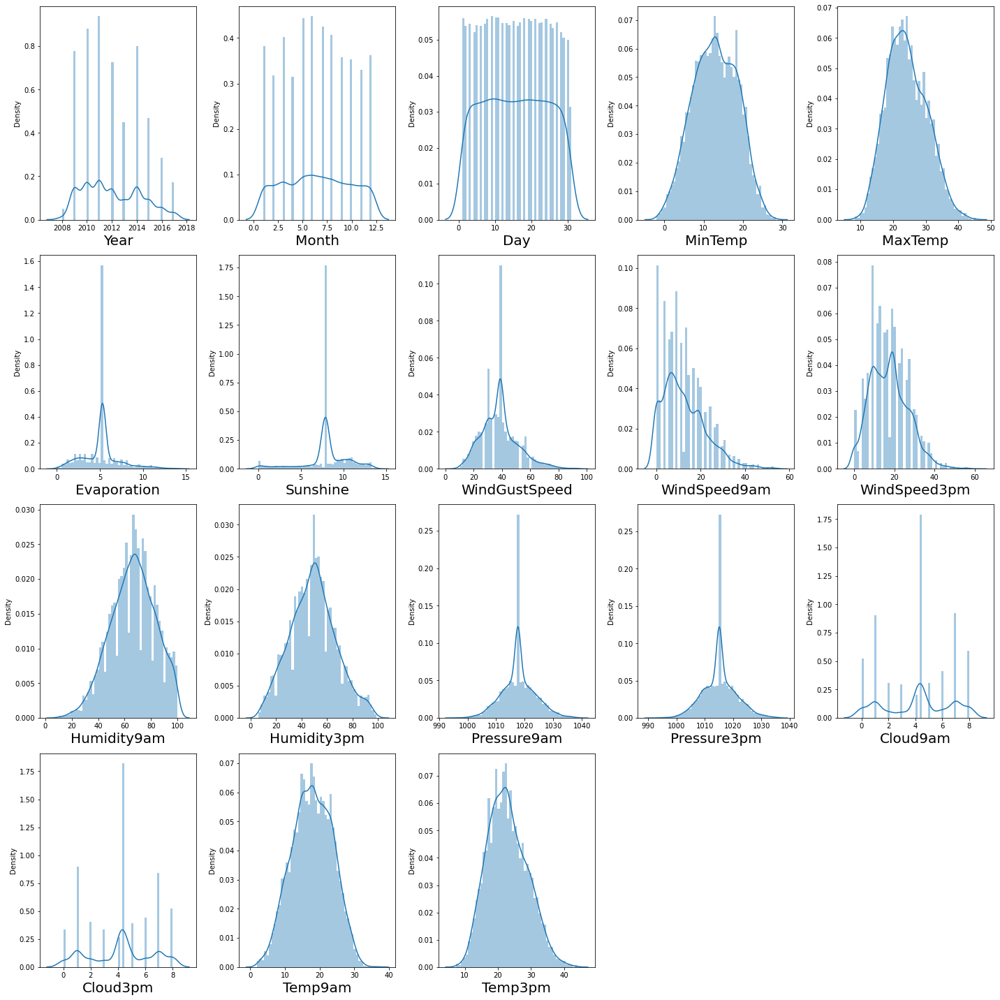

In [34]:
num= ['Year', 'Month', 'Day', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
      'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
      'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,20))
for x in num:
    plt.subplot(4,5,i+1)
    sns.distplot(rain_new[x], bins=50)
    plt.xlabel(x,fontsize=20)
    i=i+1
plt.tight_layout()

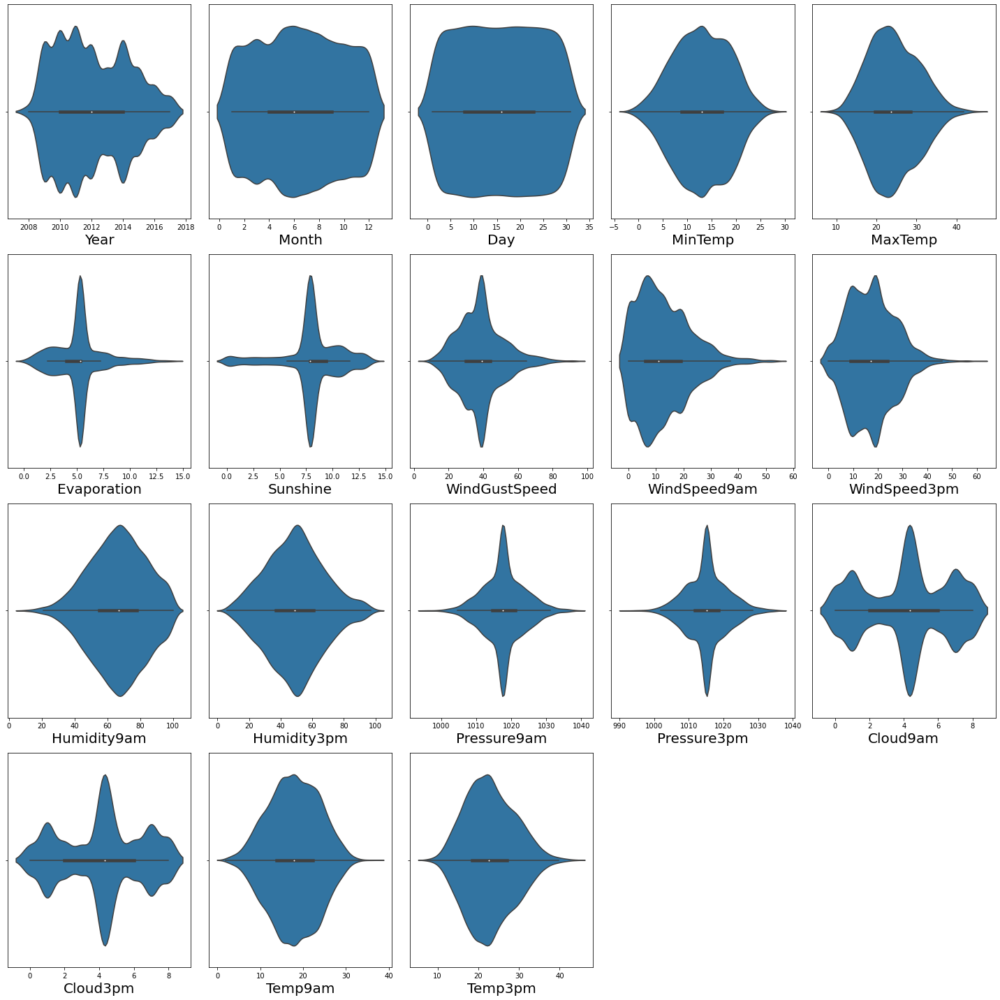

In [35]:
num= ['Year', 'Month', 'Day', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
      'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
      'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,20))
for x in num:
    plt.subplot(4,5,i+1)
    sns.violinplot(rain_new[x])
    plt.xlabel(x,fontsize=20)
    i=i+1
plt.tight_layout()

## Analysis of Target variable:

In [36]:
rain_new["RainTomorrow"].value_counts()

No     4894
Yes    1232
Name: RainTomorrow, dtype: int64

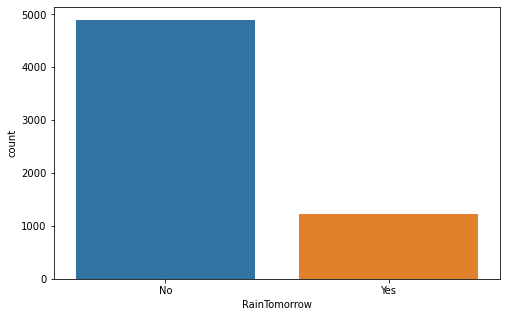

In [37]:
plt.figure(figsize=(8,5))
sns.countplot(rain_new["RainTomorrow"])
plt.show()

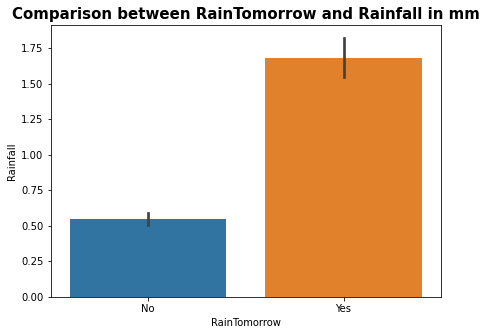

In [38]:
plt.figure(figsize=(7,5))
sns.barplot(x = "RainTomorrow", y = "Rainfall", data = rain_new)
plt.title('Comparison between RainTomorrow and Rainfall in mm', fontsize=15, fontweight='bold')
plt.show()


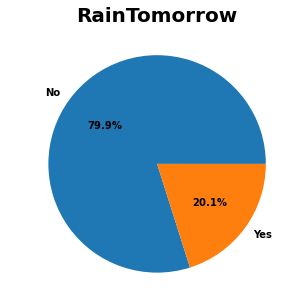

In [39]:
plt.subplots(figsize=(8,5))
rain_new['RainTomorrow'].value_counts().plot.pie(autopct='%2.1f%%', textprops ={ 'fontweight': 'bold','fontsize':10})
plt.title('RainTomorrow', fontsize=20,fontweight ='bold')
plt.ylabel( ' ')
plt.show()

79.7% data has No outcomes for Raintomorrow.

The chance of rainnig tomorrow is less.

If rainfall range in between 0-0.50, the chance for raining tomorrow is No, otherwise it is Yes.

Outliers are present in the dataset.

The dataset is imbalance with respect to target variable 1 which is RainTomorrow.

## Rainfall (target2):

In [40]:
print('Maximum Rainfall value is:',rain_new.Rainfall.max(),"mm")
print('Minimum Rainfall value is:',rain_new.Rainfall.min(),"mm")
print('Mean Rainfall value is:',rain_new.Rainfall.mean(),"mm")
print('Sum of the Rainfall value is:',rain_new.Rainfall.sum(),"mm")

Maximum Rainfall value is: 9.4 mm
Minimum Rainfall value is: 0.0 mm
Mean Rainfall value is: 0.7749886171596119 mm
Sum of the Rainfall value is: 4747.580268719809 mm


In [41]:
print ('The number of values with maximum Rainfall', rain_new['Rainfall'].value_counts()[0.0])

The number of values with maximum Rainfall 4270


In [42]:
print ('The number of values with minimum Rainfall', rain_new['Rainfall'].value_counts()[0.0])

The number of values with minimum Rainfall 4270


In [43]:
print(" Details of maximum Rainfall value which is 10.0 mm:\n")

rain_new.loc[rain_new.Rainfall==10.0]

 Details of maximum Rainfall value which is 10.0 mm:



,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day


1-Min rainfall is 0 mm and maximim is 10.0 mm.

2-The number of data with maximum Rainfall (10.0 mm) is 10.

3-Most of the case the location of 10.0 mm rainfall is Newcastle and CoffsHarbour.

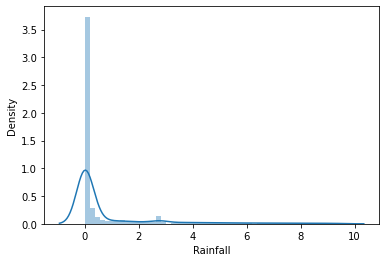

In [44]:
plt.figure(figsize=(6,4))
sns.distplot(rain_new.Rainfall)
plt.show()


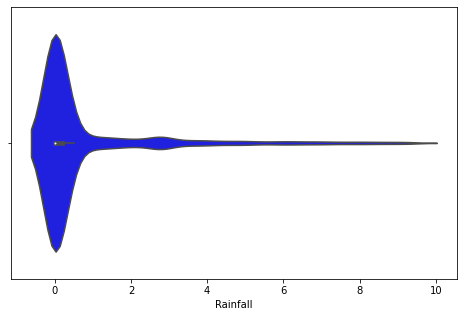

In [45]:
plt.figure(figsize=(8,5))
sns.violinplot(rain_new.Rainfall, color='blue')
plt.show()

For maximum case, Rainfall is 0. Let's explore it further.

In [46]:
rain0 = rain_new.loc[rain_new.Rainfall == 0].shape
rain0

(4270, 25)

In [47]:
# percentage of Rainfall =0:
print ("Percentage of Rainfall eual to 0 mm is:", rain0[0]/rain_new.shape[0]*100,"%")

Percentage of Rainfall eual to 0 mm is: 69.70290564805745 %


In [48]:
rain_new["Rainfall"].groupby(rain_new["WindDir9am"]).agg([min, max, sum])

,min,max,sum
WindDir9am,,,
E,0.0,8.6,95.560296
ENE,0.0,7.8,116.560296
ESE,0.0,9.4,114.520592
N,0.0,9.4,1028.346362
NE,0.0,9.4,196.800740
NNE,0.0,9.2,237.540444
NNW,0.0,8.8,141.461036
NW,0.0,9.2,271.321332
S,0.0,9.4,242.701479


In [49]:
rain_new["Rainfall"].groupby(rain_new["Location"]).agg([min, max, sum])

,min,max,sum
Location,,,
Adelaide,0.0,8.8,148.320592
Albury,0.0,9.4,552.821332
Brisbane,0.0,8.6,358.900740
CoffsHarbour,0.0,9.4,462.180148
Darwin,0.0,8.2,81.400000
Melbourne,0.0,9.4,821.028729
Newcastle,0.0,9.2,632.722071
Penrith,0.0,9.4,327.540444
PerthAirport,0.0,9.4,687.000000


1-For 4299 case that is around 70% cases, the rainfall is 0 mm.
2-For maximum rainfall value (which is 1035 mm), WindDir9am is North(N).
3-For Uluru, the total rainfall is lowest.

## Checking different feature Vs"RainTomorrow" :

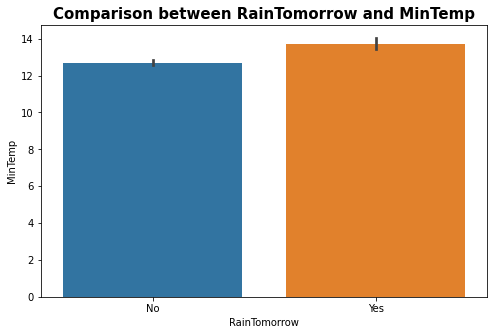

In [50]:
plt.figure(figsize=(8,5))
sns.barplot(x = "RainTomorrow", y = "MinTemp", data = rain_new)
plt.title('Comparison between RainTomorrow and MinTemp', fontsize=15, fontweight='bold')
plt.show()

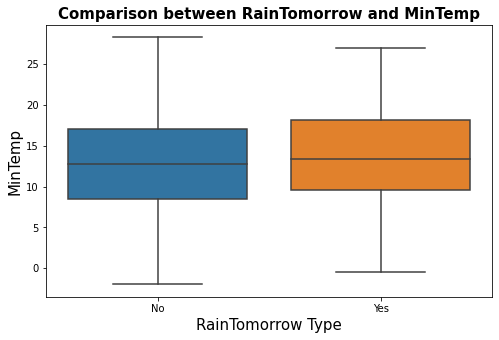

In [51]:
plt.figure(figsize=[8,5])
plt.title('Comparison between RainTomorrow and MinTemp',fontsize=15, fontweight= "bold")
a = sns.boxplot(rain_new['RainTomorrow'],rain_new["MinTemp"])
a.set_xlabel('RainTomorrow Type',fontsize=15)
a.set_ylabel('MinTemp',fontsize=15)
plt.show()

There is no specific relation between RainTomorrow and MinTemp.

Avg temparature for RainTomorrow= Yes, is slightly greater than for the case RainTomorrow= No.

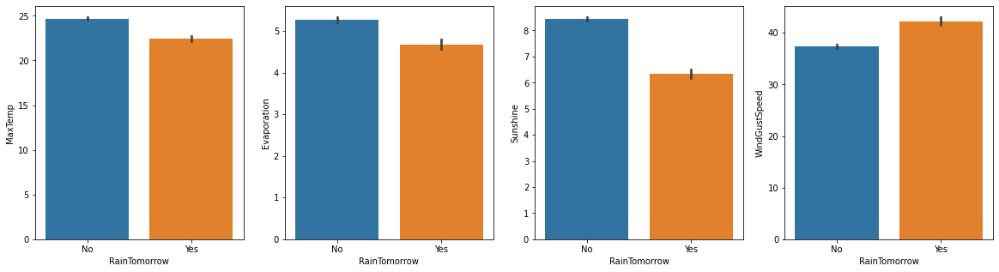

In [52]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.barplot(x = "RainTomorrow", y = "MaxTemp", data = rain_new, ax=ax[0])
sns.barplot(x = "RainTomorrow", y = "Evaporation",data=rain_new, ax=ax[1])
sns.barplot(x = "RainTomorrow", y = "Sunshine", data = rain_new, ax=ax[2])
sns.barplot(x = "RainTomorrow", y = "WindGustSpeed",data=rain_new, ax=ax[3])
plt.show()

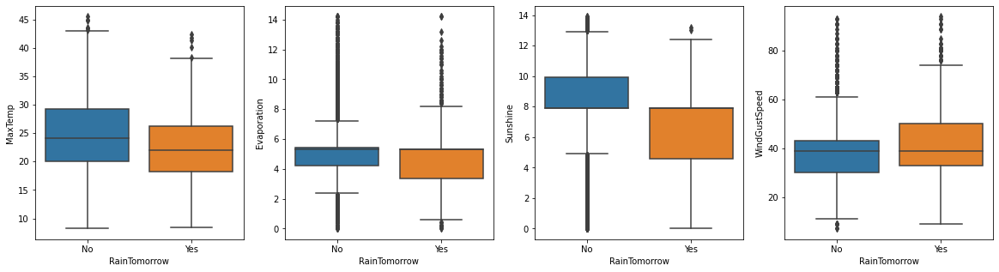

In [53]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.boxplot(x = "RainTomorrow", y = "MaxTemp", data = rain_new, ax=ax[0])
sns.boxplot(x = "RainTomorrow", y = "Evaporation",data=rain_new, ax=ax[1])
sns.boxplot(x = "RainTomorrow", y = "Sunshine", data = rain_new, ax=ax[2])
sns.boxplot(x = "RainTomorrow", y = "WindGustSpeed",data=rain_new, ax=ax[3])
plt.show()

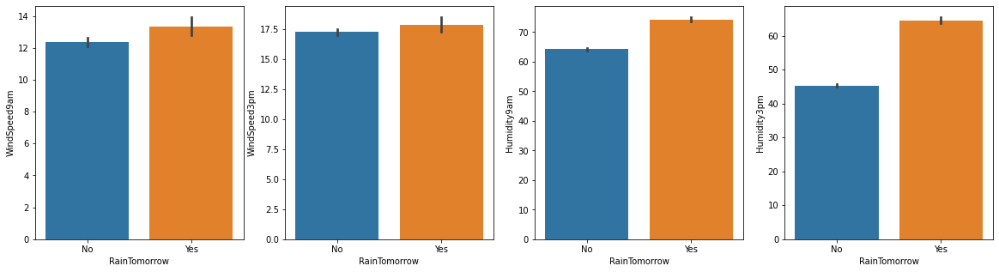

In [54]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.barplot(x = "RainTomorrow", y = "WindSpeed9am", data = rain_new, ax=ax[0])
sns.barplot(x = "RainTomorrow", y = "WindSpeed3pm",data=rain_new, ax=ax[1])
sns.barplot(x = "RainTomorrow", y = "Humidity9am", data = rain_new, ax=ax[2])
sns.barplot(x = "RainTomorrow", y = "Humidity3pm",data=rain_new, ax=ax[3])
plt.show()

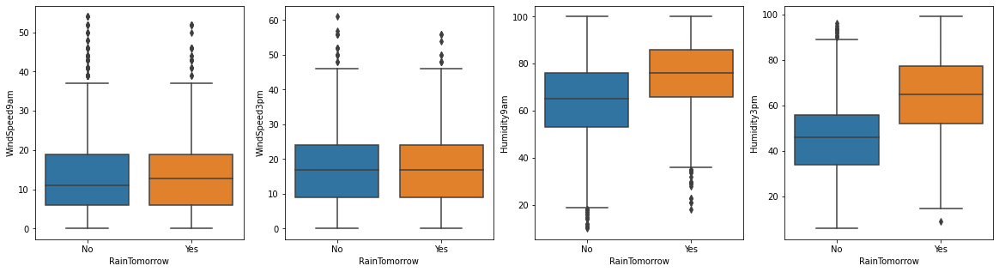

In [55]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.boxplot(x = "RainTomorrow", y = "WindSpeed9am", data = rain_new, ax=ax[0])
sns.boxplot(x = "RainTomorrow", y = "WindSpeed3pm",data=rain_new, ax=ax[1])
sns.boxplot(x = "RainTomorrow", y = "Humidity9am", data = rain_new, ax=ax[2])
sns.boxplot(x = "RainTomorrow", y = "Humidity3pm",data=rain_new, ax=ax[3])
plt.show()

1-If Humidity level is around 40, RainTomorrow is No and if Humidity level is around 60, RainTomorrow is Yes.

2-For high Humidity level, the raining tendency is high.

3-There is no such relaion between WindSpeed and RainTomorrow.

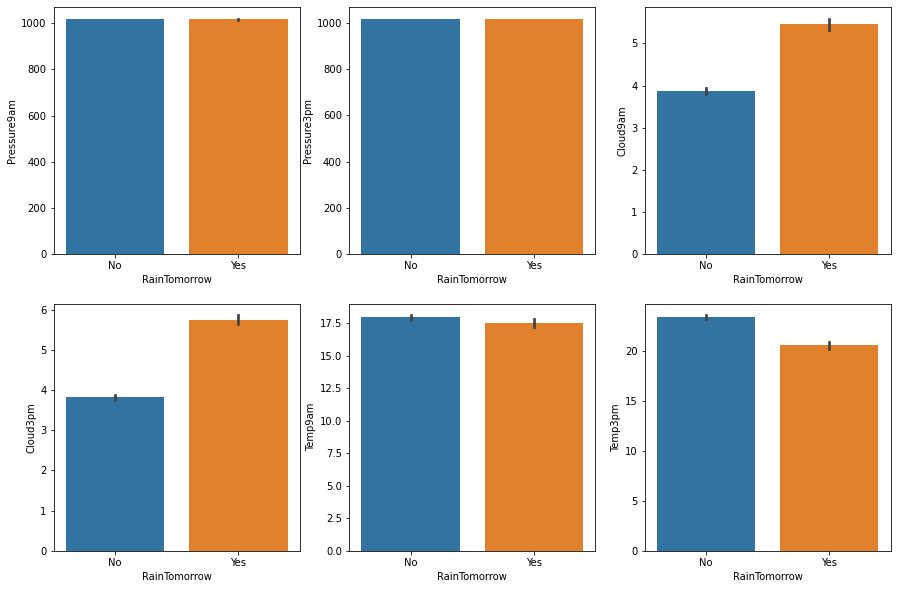

In [56]:
f,ax=plt.subplots(2,3,figsize=(15,10))
sns.barplot(x = "RainTomorrow", y = "Pressure9am", data = rain_new, ax=ax[0,0])
sns.barplot(x = "RainTomorrow", y = "Pressure3pm",data=rain_new, ax=ax[0,1])
sns.barplot(x = "RainTomorrow", y = "Cloud9am", data = rain_new, ax=ax[0,2])
sns.barplot(x = "RainTomorrow", y = "Cloud3pm",data=rain_new, ax=ax[1,0])
sns.barplot(x = "RainTomorrow", y = "Temp9am", data = rain_new, ax=ax[1,1])
sns.barplot(x = "RainTomorrow", y = "Temp3pm",data=rain_new, ax=ax[1,2])
plt.show()

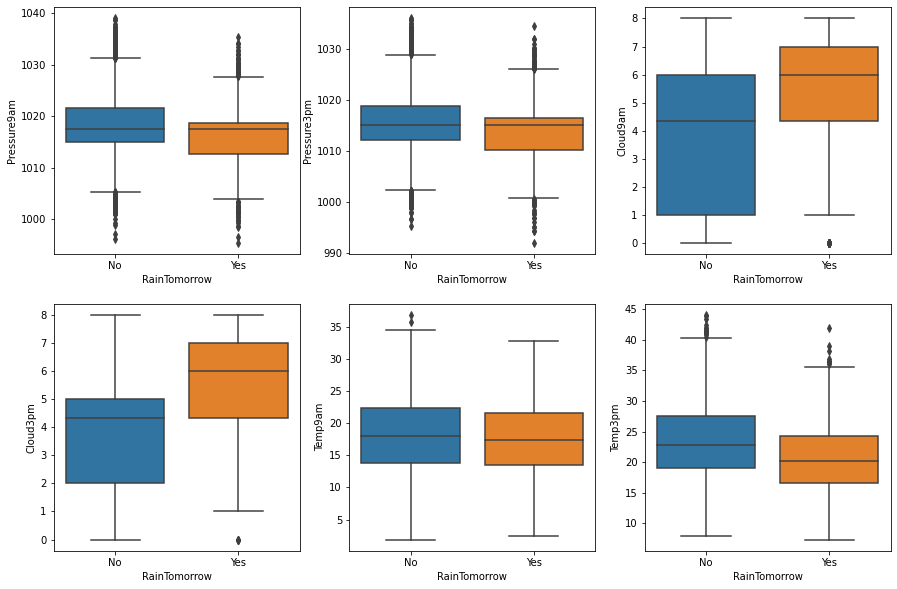

In [57]:
f,ax=plt.subplots(2,3,figsize=(15,10))
sns.boxplot(x = "RainTomorrow", y = "Pressure9am", data = rain_new, ax=ax[0,0])
sns.boxplot(x = "RainTomorrow", y = "Pressure3pm",data=rain_new, ax=ax[0,1])
sns.boxplot(x = "RainTomorrow", y = "Cloud9am", data = rain_new, ax=ax[0,2])
sns.boxplot(x = "RainTomorrow", y = "Cloud3pm",data=rain_new, ax=ax[1,0])
sns.boxplot(x = "RainTomorrow", y = "Temp9am", data = rain_new, ax=ax[1,1])
sns.boxplot(x = "RainTomorrow", y = "Temp3pm",data=rain_new, ax=ax[1,2])
plt.show()

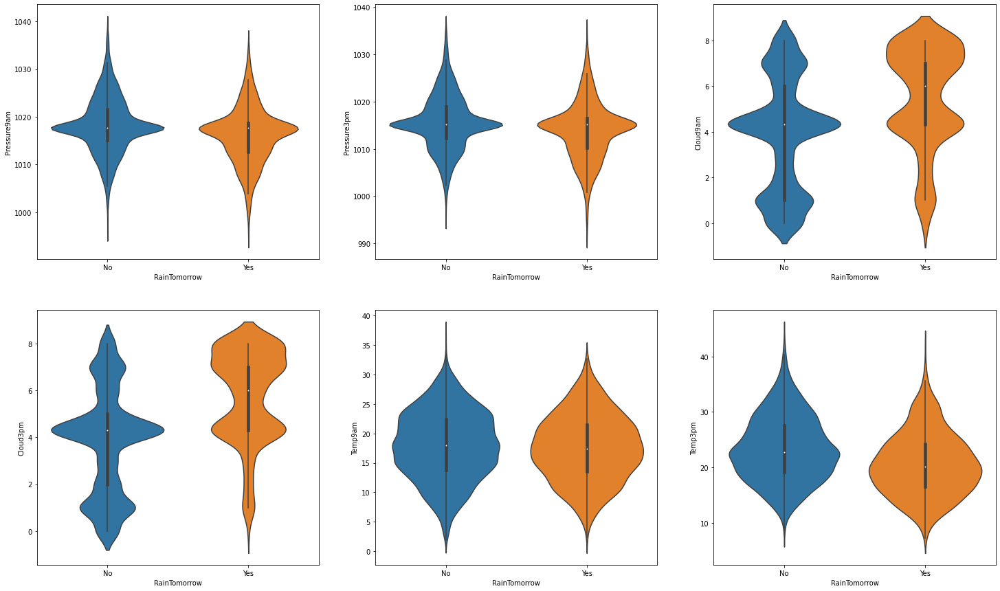

In [58]:
f,ax=plt.subplots(2,3,figsize=(25,15))
sns.violinplot(x = "RainTomorrow", y = "Pressure9am", data = rain_new, ax=ax[0,0])
sns.violinplot(x = "RainTomorrow", y = "Pressure3pm",data=rain_new, ax=ax[0,1])
sns.violinplot(x = "RainTomorrow", y = "Cloud9am", data = rain_new, ax=ax[0,2])
sns.violinplot(x = "RainTomorrow", y = "Cloud3pm",data=rain_new, ax=ax[1,0])
sns.violinplot(x = "RainTomorrow", y = "Temp9am", data = rain_new, ax=ax[1,1])
sns.violinplot(x = "RainTomorrow", y = "Temp3pm",data=rain_new, ax=ax[1,2])

plt.show()

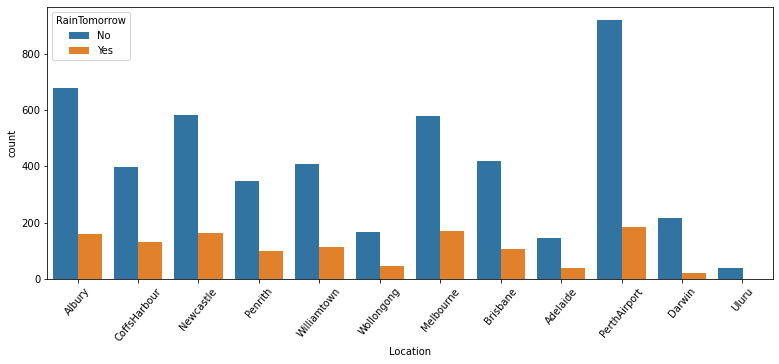

In [59]:
plt.subplots(figsize=(13,5))
sns.countplot(rain_new["Location"], hue= rain_new["RainTomorrow"])
plt.xticks(rotation=50)
plt.show()

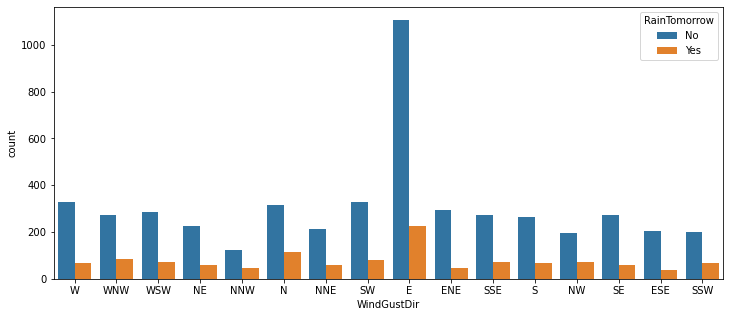

In [60]:
plt.subplots(figsize=(12,5))
sns.countplot(rain_new["WindGustDir"], hue= rain_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

In [61]:
pd.crosstab(rain['RainTomorrow'],rain["Location"], margins= True)

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong,All
RainTomorrow,,,,,,,,,,,,,
No,160,708,444,425,218,608,624,366,962,39,462,174,5190
Yes,45,199,135,186,32,203,198,116,242,0,153,63,1572
All,205,907,579,611,250,811,822,482,1204,39,615,237,6762


In [62]:
pd.crosstab(rain['RainTomorrow'],rain["WindGustDir"], margins= True)

WindGustDir,E,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,All
RainTomorrow,,,,,,,,,,,,,,,,,
No,1183,302,212,326,230,218,129,205,278,288,296,218,351,348,290,316,5190
Yes,277,55,55,133,70,69,55,91,98,82,94,81,114,86,108,104,1572
All,1460,357,267,459,300,287,184,296,376,370,390,299,465,434,398,420,6762


1-For ParthAirport, the probability of raining tomorrow is high.

2-For Uluru, there is no probability of Raining tomorrow.

3-Maximium WindGust direction is East(E).

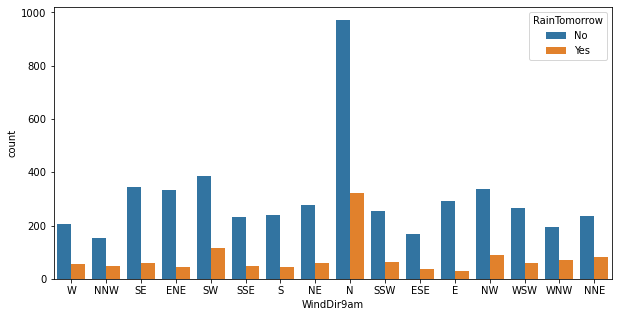

In [63]:
plt.subplots(figsize=(10,5))
sns.countplot(rain_new["WindDir9am"], hue= rain_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

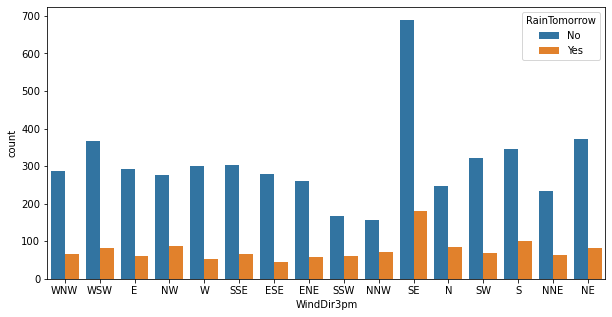

In [64]:
plt.subplots(figsize=(10,5))
sns.countplot(rain_new["WindDir3pm"], hue= rain_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

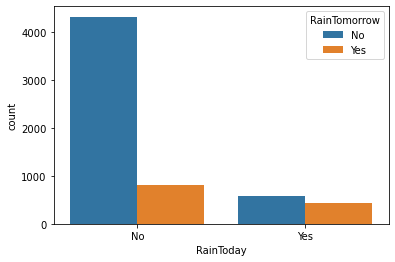

In [65]:
plt.subplots(figsize=(6,4))
sns.countplot(rain_new["RainToday"], hue= rain_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

In [66]:
pd.crosstab(rain['RainTomorrow'],rain["RainToday"], margins= True)

RainToday,No,Yes,All
RainTomorrow,,,
No,4374,816,5190
Yes,816,756,1572
All,5190,1572,6762


In [67]:
756/1572

0.48091603053435117

1-Maximum wind direction at 9am (WindDir9am) is North(N).
2-Maximum wind direction at 3pm (WindDir3pm) is South East(SE).
3-If RainToday is Yes then there is around 50%.

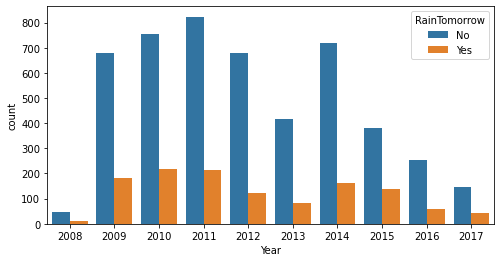

In [68]:
plt.subplots(figsize=(8,4))
sns.countplot(rain_new["Year"], hue= rain_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

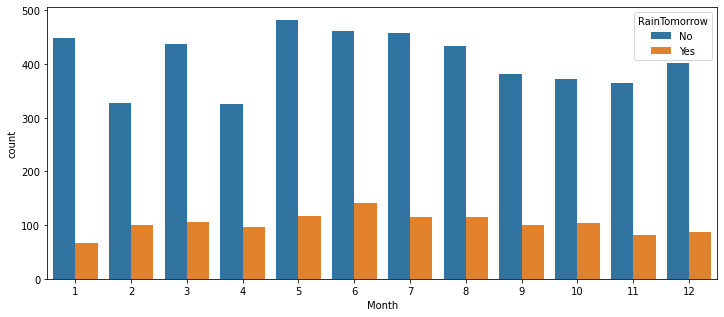

In [69]:
plt.subplots(figsize=(12,5))
sns.countplot(rain_new["Month"],hue=rain_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

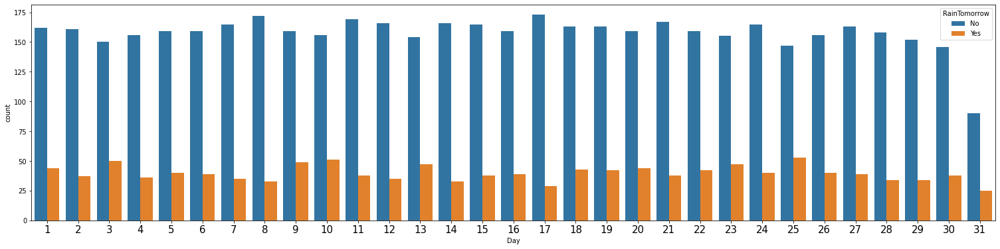

In [70]:
plt.subplots(figsize=(26,6))
sns.countplot(rain_new["Day"],hue=rain_new["RainTomorrow"])
plt.xticks(rotation=0,fontsize=15)
plt.show()

No such relation is found between days, month and year with RainTomorrow.

## Checking different feature Vs"Rainfall" :

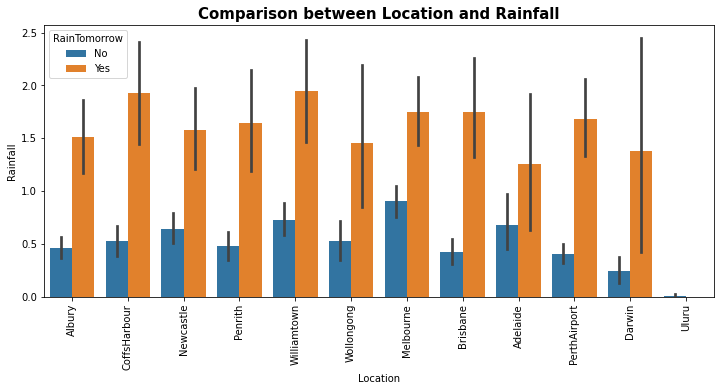

In [71]:
plt.figure(figsize=(12,5))
sns.barplot(x = "Location", y = "Rainfall",hue= 'RainTomorrow' , data = rain_new)
plt.title('Comparison between Location and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

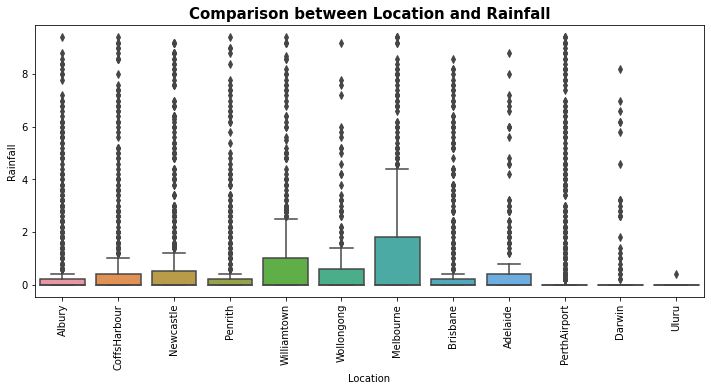

In [72]:
plt.figure(figsize=(12,5))
sns.boxplot(x = "Location", y = "Rainfall", data = rain_new)
plt.title('Comparison between Location and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

1-For every case, Rainfall is high if RainTomorrow is Yes.

2-The average Rainfall is high for Melbourne and Williamtown.

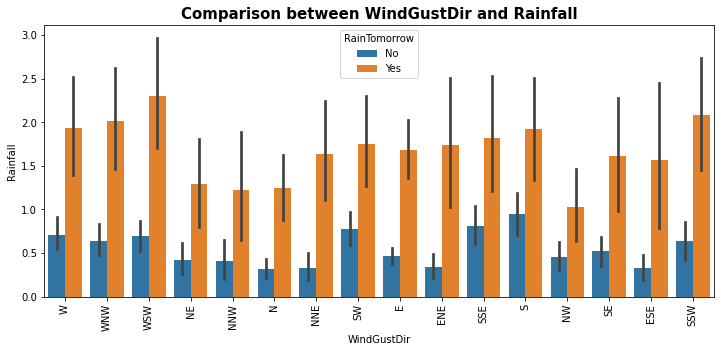

In [73]:
plt.figure(figsize=(12,5))
sns.barplot(x = "WindGustDir", y = "Rainfall", hue= 'RainTomorrow', data = rain_new)
plt.title('Comparison between WindGustDir and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

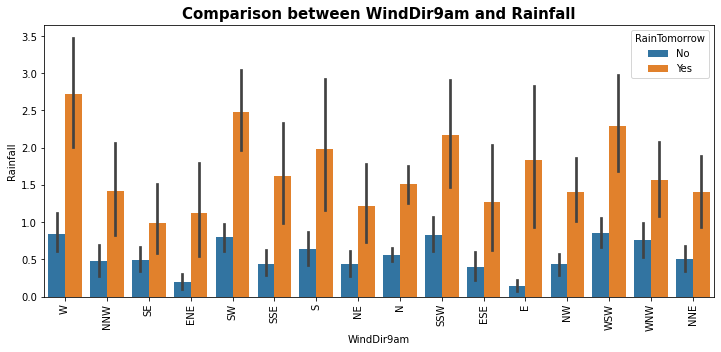

In [74]:
plt.figure(figsize=(12,5))
sns.barplot(x = "WindDir9am", y = "Rainfall",hue= 'RainTomorrow', data = rain_new)
plt.title('Comparison between WindDir9am and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

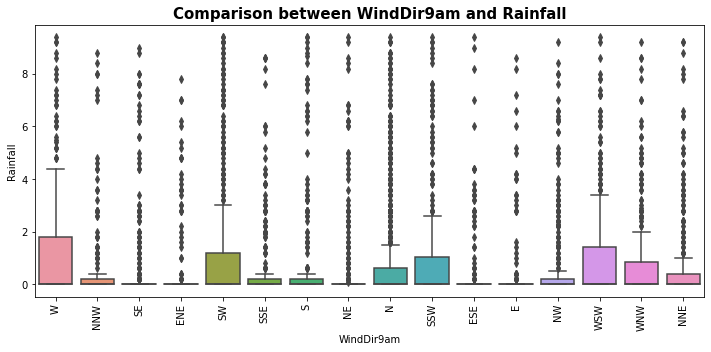

In [75]:
plt.figure(figsize=(12,5))
sns.boxplot(x = "WindDir9am", y = "Rainfall", data = rain_new)
plt.title('Comparison between WindDir9am and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

1-For WSW direction of wind gust, rain fall value is maximum(seems by barplot).

2-For West direction of wind at 9am, rain fall value is maximum.

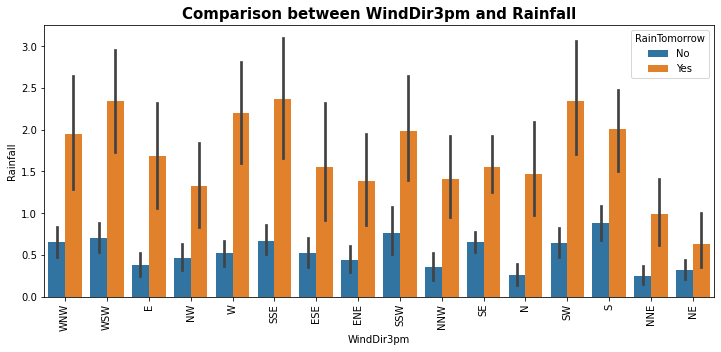

In [76]:
plt.figure(figsize=(12,5))
sns.barplot(x = "WindDir3pm", y = "Rainfall", hue= 'RainTomorrow',data = rain_new)
plt.title('Comparison between WindDir3pm and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

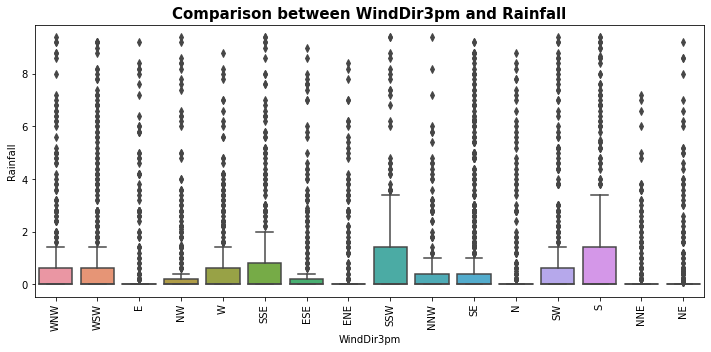

In [77]:
plt.figure(figsize=(12,5))
sns.boxplot(x = "WindDir3pm", y = "Rainfall", data = rain_new)
plt.title('Comparison between WindDir3pm and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

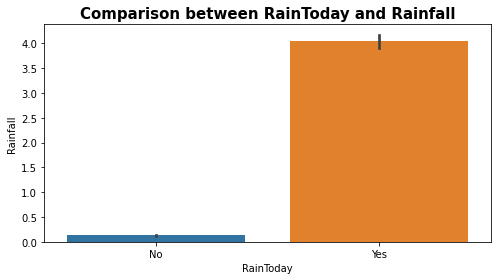

In [78]:
plt.figure(figsize=(8,4))
sns.barplot(x = "RainToday", y = "Rainfall", data = rain_new)
plt.title('Comparison between RainToday and Rainfall', fontsize=15, fontweight='bold')
plt.show()

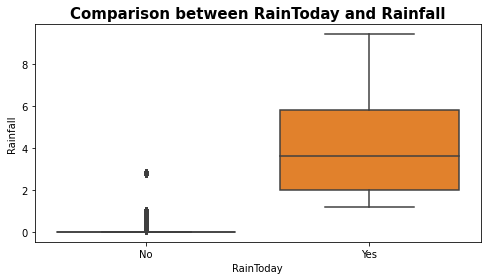

In [79]:
plt.figure(figsize=(8,4))
sns.boxplot(x = "RainToday", y = "Rainfall", data = rain_new)
plt.title('Comparison between RainToday and Rainfall', fontsize=15, fontweight='bold')
plt.show()

1-If direction of wind gust is WSW and SSE, rain fall value is maximum(seems by barplot).

2-Max avg direction of wind gust is SSW.

3-If Rainfall is 0, raintoday value is No.

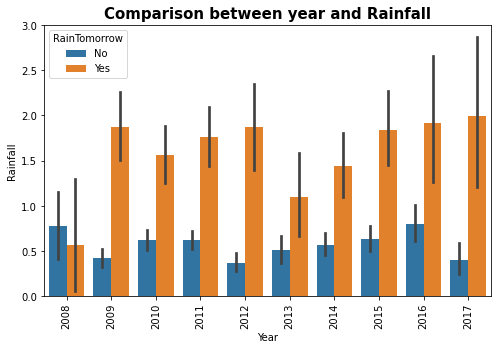

In [80]:
plt.figure(figsize=(8,5))
sns.barplot(x = "Year", y = "Rainfall", hue= 'RainTomorrow', data = rain_new)
plt.title('Comparison between year and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

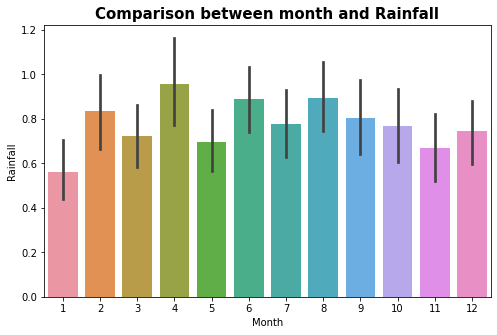

In [81]:
plt.figure(figsize=(8,5))
sns.barplot(x = "Month", y = "Rainfall", data = rain_new)
plt.title('Comparison between month and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=0)
plt.show()

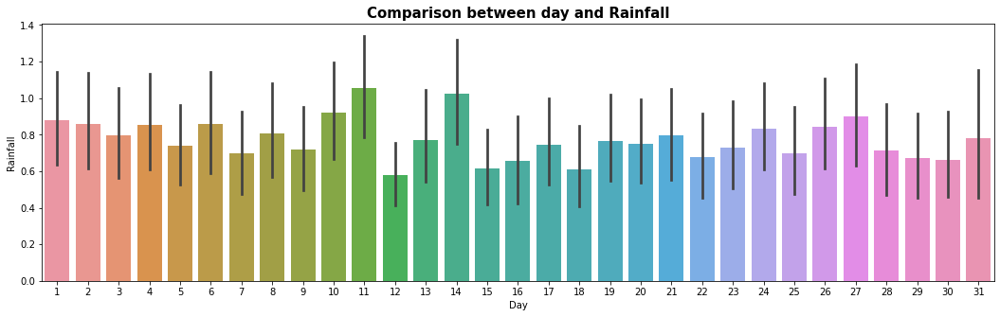

In [82]:
plt.figure(figsize=(18,5))
sns.barplot(x = "Day", y = "Rainfall", data = rain_new)
plt.title('Comparison between day and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=0)
plt.show()

There is no such relation between year, month, days with Rainfall.

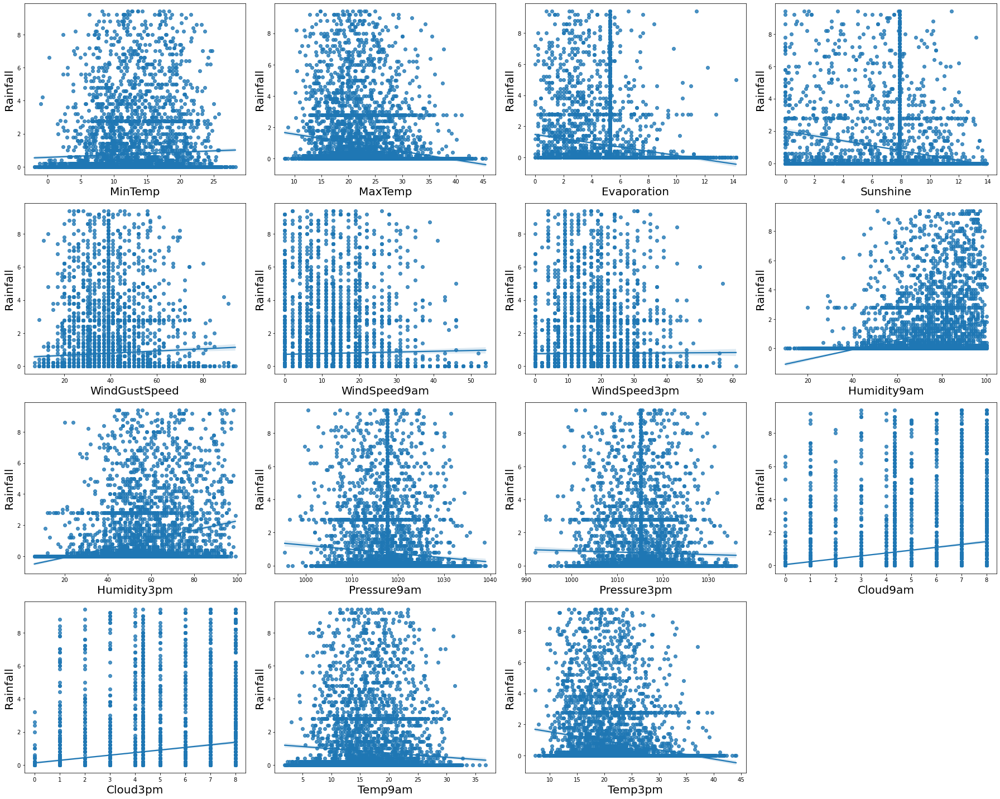

In [83]:
#linear regplot with distribution of numerical features with Rainfall

rain_num = rain_new[['MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 
                     'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                     'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]
i=0
plt.figure(figsize=(25,20))
for p in rain_num.columns:
    plt.subplot(4,4,i+1)
    sns.regplot(x= p, y=rain_new['Rainfall'], data=rain_num)
    plt.xlabel(p,fontsize=20)
    plt.ylabel('Rainfall',fontsize=20)
    i+=1    
plt.tight_layout()

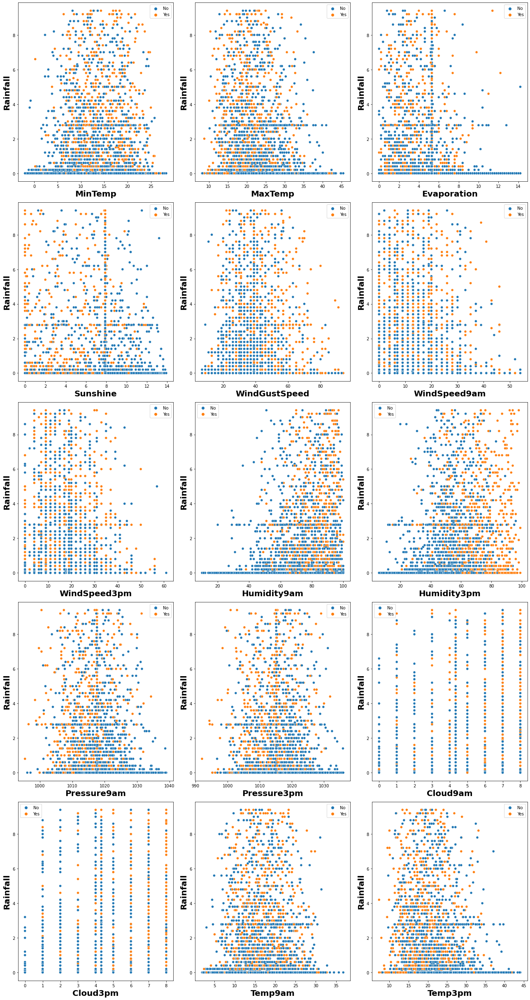

In [84]:
i=0
plt.figure(figsize=(18,40))
for p in rain_num.columns:
    plt.subplot(6,3,i+1)
    sns.scatterplot(x=p, y='Rainfall',data= rain_new, hue='RainTomorrow' ).legend(loc="best")
    plt.xlabel(p,fontsize=20,fontweight='bold')
    plt.ylabel('Rainfall',fontsize=20, fontweight='bold')
    i+=1   
plt.tight_layout()
plt.show()

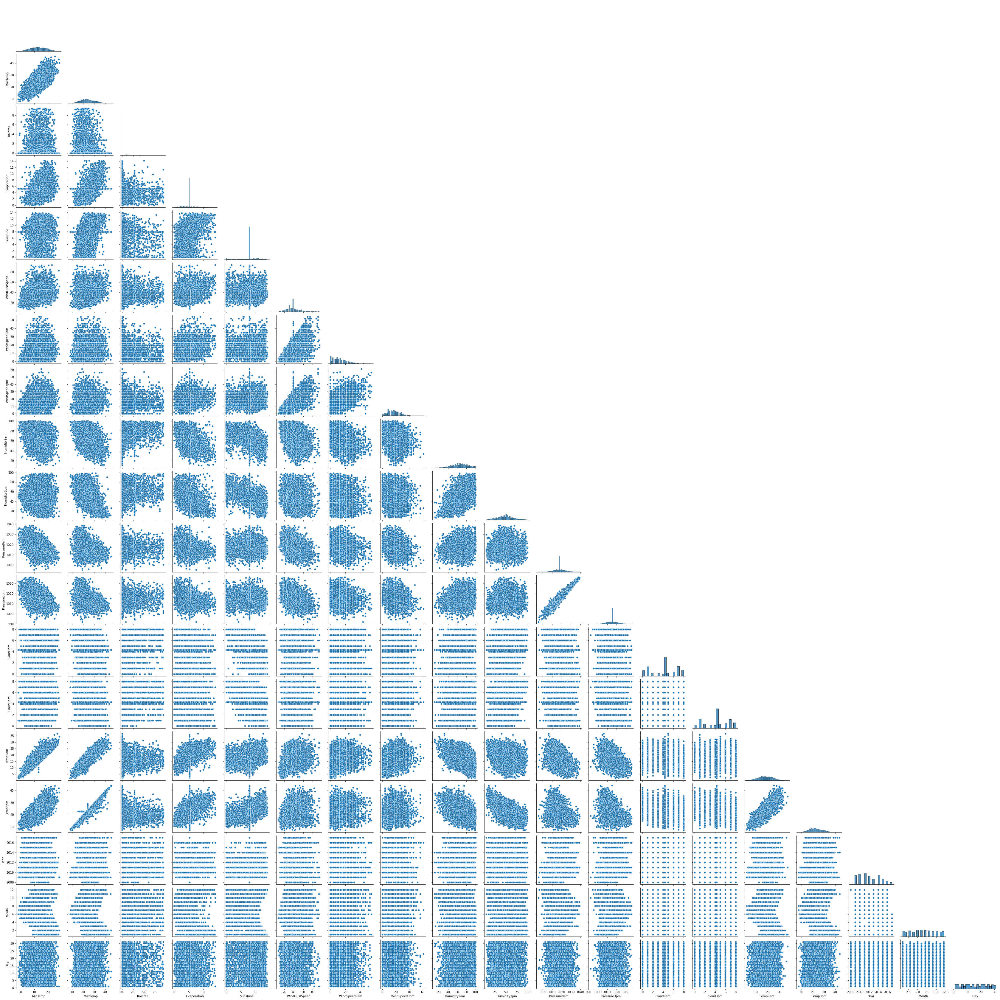

In [85]:
sns.pairplot(rain_new,kind='scatter',corner=True)

1-If sunshine increased, tendency of rainning tomorrow is also less.
2-Clearly, if the fraction of sky obscured by cloud is increased, raining tendency is also increased.

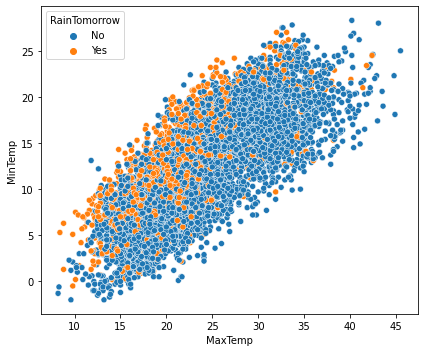

In [86]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='MaxTemp', y='MinTemp',data= rain_new, hue='RainTomorrow' )
plt.tight_layout()
plt.show()

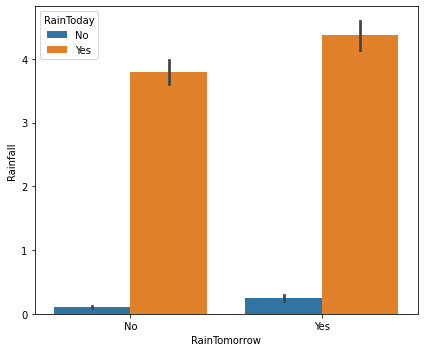

In [87]:
plt.figure(figsize=(6,5))
sns.barplot(y='Rainfall', x='RainTomorrow',data= rain_new, hue='RainToday' )
plt.tight_layout()
plt.show()

The relation between Rainfall and raining tendency of tomorrow (RainTomorrow) is very obvious!! It is proved again. If rainfall amount increased, raining tendency of tomorrow is Yes.

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

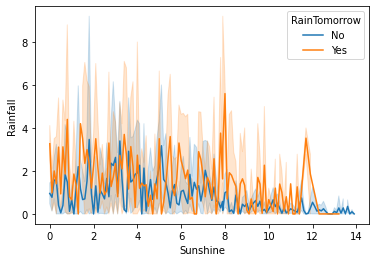

In [88]:
sns.lineplot(data=rain_new, x='Sunshine',y='Rainfall',hue= 'RainTomorrow', color='green')

<AxesSubplot:xlabel='Sunshine', ylabel='Evaporation'>

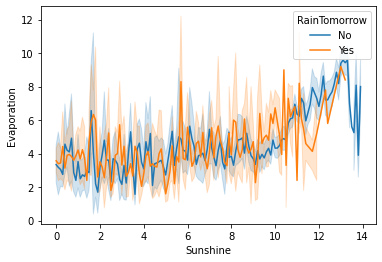

In [89]:
sns.lineplot(data=rain_new, x='Sunshine',y='Evaporation', hue= 'RainTomorrow')

1-In lineplot it is clearly seen that, if Sunshine increased, Rainfall decresed.
2-If shunshine increased, Evaporation rate is also increased.

# Encoding for categorical features:

### Using label encoder:

In [90]:
cat=['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in cat:
    rain_new[i] = le.fit_transform(rain_new[i])
rain_new.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,0.6,5.302395,7.890896,13,44.0,13,14,...,1007.1,8.000000,4.320988,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,5.302395,7.890896,14,44.0,6,15,...,1007.8,4.336806,4.320988,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,5.302395,7.890896,15,46.0,13,15,...,1008.7,4.336806,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,5.302395,7.890896,4,24.0,9,0,...,1012.8,4.336806,4.320988,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,5.302395,7.890896,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,5


# Correlation:

In [91]:
rain_new.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.100299,0.078930,0.012198,0.136590,0.055123,-0.087716,0.275553,-0.097492,-0.002113,...,-0.044183,-0.006789,-0.007769,0.106360,0.074699,-0.007438,-0.004099,0.501098,-0.071622,0.002758
MinTemp,0.100299,1.000000,0.740106,0.048965,0.388565,0.073447,-0.136940,0.259290,-0.018169,-0.131533,...,-0.456040,0.073530,0.026446,0.895161,0.709250,0.034674,0.073803,0.033183,-0.233746,0.018440
MaxTemp,0.078930,0.740106,1.000000,-0.189199,0.491256,0.367862,-0.190084,0.198523,-0.183513,-0.144077,...,-0.436974,-0.238353,-0.234449,0.868080,0.974838,-0.208169,-0.145923,0.082586,-0.174078,0.020809
Rainfall,0.012198,0.048965,-0.189199,1.000000,-0.165667,-0.227230,0.086059,0.047505,0.114759,0.085656,...,-0.024911,0.238592,0.201230,-0.084037,-0.195897,0.810606,0.254085,0.013556,0.007263,-0.017308
Evaporation,0.136590,0.388565,0.491256,-0.165667,1.000000,0.407239,-0.129751,0.226950,-0.138139,-0.019651,...,-0.319438,-0.129599,-0.170725,0.448417,0.479599,-0.172013,-0.107749,0.111069,-0.069453,0.003671
Sunshine,0.055123,0.073447,0.367862,-0.227230,0.407239,1.000000,-0.094165,0.039404,-0.074451,-0.057264,...,-0.080037,-0.536329,-0.560307,0.260435,0.386225,-0.214729,-0.317044,0.048475,-0.008977,0.000131
WindGustDir,-0.087716,-0.136940,-0.190084,0.086059,-0.129751,-0.094165,1.000000,-0.011376,0.367812,0.454840,...,-0.014925,0.123638,0.079779,-0.144820,-0.203474,0.097523,0.032556,-0.180000,0.025528,0.018463
WindGustSpeed,0.275553,0.259290,0.198523,0.047505,0.226950,0.039404,-0.011376,1.000000,-0.092552,0.063703,...,-0.352202,-0.020323,0.032719,0.247892,0.164755,0.039574,0.149298,-0.018517,0.048258,-0.006958
WindDir9am,-0.097492,-0.018169,-0.183513,0.114759,-0.138139,-0.074451,0.367812,-0.092552,1.000000,0.207326,...,0.049316,0.065307,0.052507,-0.058660,-0.191915,0.125222,0.024381,-0.066186,0.015080,-0.012727
WindDir3pm,-0.002113,-0.131533,-0.144077,0.085656,-0.019651,-0.057264,0.454840,0.063703,0.207326,1.000000,...,-0.046963,0.066562,0.049422,-0.130083,-0.157738,0.084493,-0.005754,0.009174,0.024282,0.004444


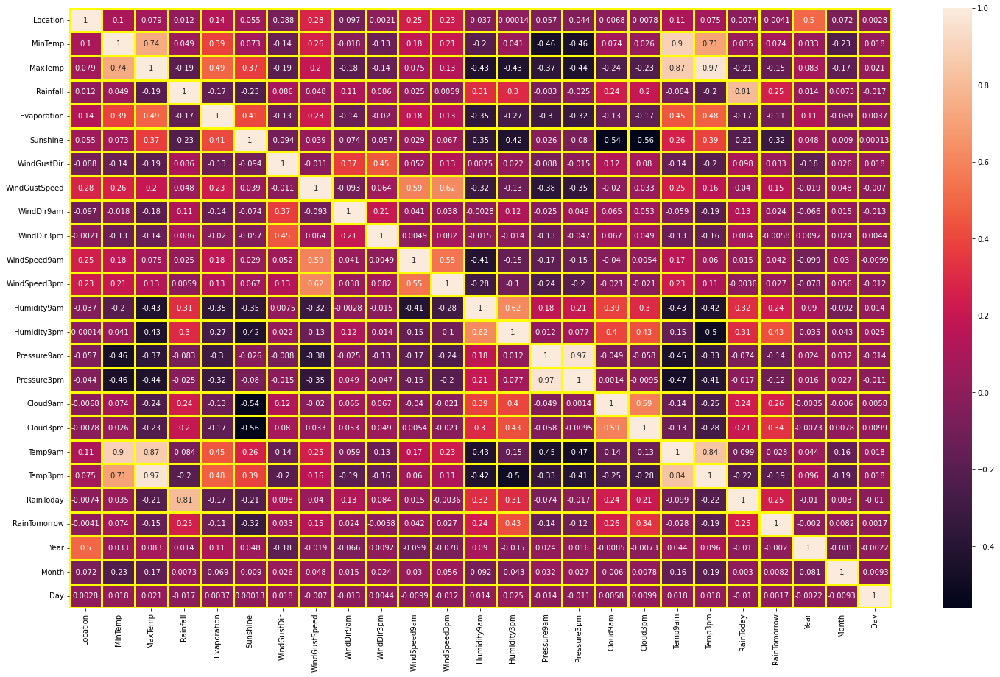

In [92]:
plt.subplots(figsize=(25,15))
sns.heatmap(rain_new.corr(), annot= True, linecolor= "yellow",  linewidths= 3)
plt.show()

In [93]:
rain_new.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day'],
      dtype='object')

In [94]:
rain_new1= rain_new.copy()
rain_new2= rain_new.copy()

# Correlation with Other features with RainTomorrow (label_1):

<AxesSubplot:title={'center':'feature vs RainTomorrow corr'}>

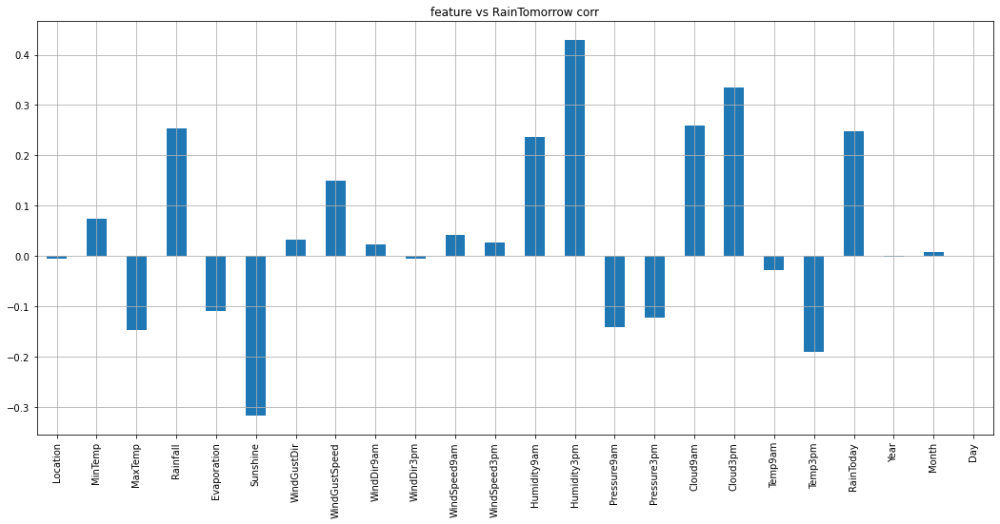

In [95]:
rain_new1.drop("RainTomorrow", axis=1).corrwith(rain_new1["RainTomorrow"]).plot(kind='bar',figsize=(18,8),grid='True',title='feature vs RainTomorrow corr')

# Correlation with Other features with Rainfall (label_2):

<AxesSubplot:title={'center':'feature vs Rainfall corr'}>

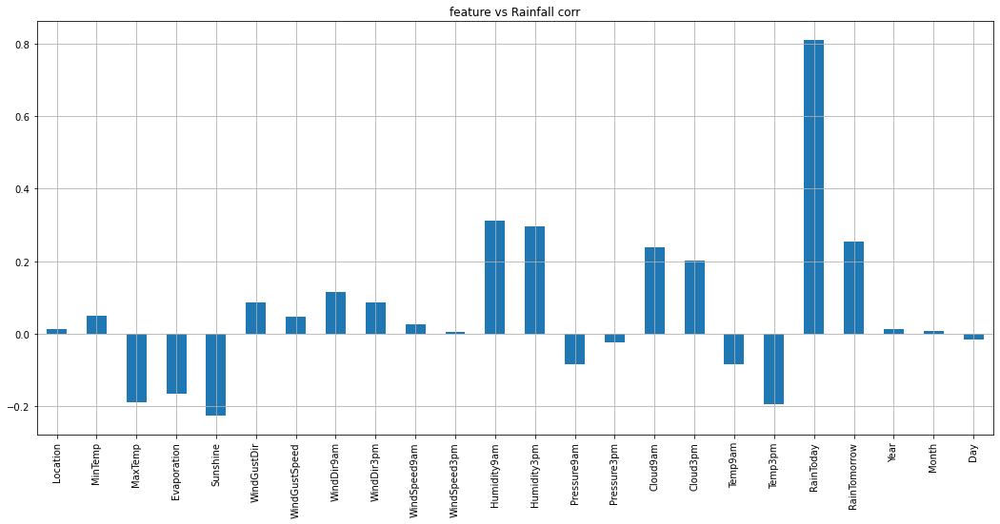

In [96]:
rain_new2.drop("Rainfall", axis=1).corrwith(rain_new2["Rainfall"]).plot(kind='bar',figsize=(18,8),grid='True',title='feature vs Rainfall corr')

# Skewness:

In [97]:
rain_new.skew().sort_values()

Sunshine        -0.876422
Humidity9am     -0.220560
Cloud9am        -0.163954
Cloud3pm        -0.127133
WindDir3pm      -0.095925
Temp9am         -0.061536
MinTemp         -0.049516
Location        -0.003094
Day              0.008275
Month            0.014783
Pressure9am      0.121917
Pressure3pm      0.134117
WindGustDir      0.135272
Humidity3pm      0.152360
WindDir9am       0.260906
MaxTemp          0.296527
Temp3pm          0.321888
Year             0.355227
WindSpeed3pm     0.491621
Evaporation      0.674730
WindGustSpeed    0.692347
WindSpeed9am     0.924169
RainTomorrow     1.491720
RainToday        1.811558
Rainfall         2.776882
dtype: float64

In [98]:
df= rain_new.copy()

In [99]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']]

,Sunshine,Humidity9am,Cloud9am,Cloud3pm,WindGustSpeed,WindSpeed9am,Evaporation,Rainfall
0,7.890896,71.0,8.000000,4.320988,44.000000,20.0,5.302395,0.6
1,7.890896,44.0,4.336806,4.320988,44.000000,4.0,5.302395,0.0
2,7.890896,38.0,4.336806,2.000000,46.000000,19.0,5.302395,0.0
3,7.890896,45.0,4.336806,4.320988,24.000000,11.0,5.302395,0.0
4,7.890896,82.0,7.000000,8.000000,41.000000,7.0,5.302395,1.0
...,...,...,...,...,...,...,...,...
8420,7.890896,51.0,4.336806,4.320988,31.000000,13.0,5.302395,0.0
8421,7.890896,56.0,4.336806,4.320988,22.000000,13.0,5.302395,0.0
8422,7.890896,53.0,4.336806,4.320988,37.000000,9.0,5.302395,0.0
8423,7.890896,51.0,3.000000,2.000000,28.000000,13.0,5.302395,0.0


In [100]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']].skew().sort_values()

Sunshine        -0.876422
Humidity9am     -0.220560
Cloud9am        -0.163954
Cloud3pm        -0.127133
Evaporation      0.674730
WindGustSpeed    0.692347
WindSpeed9am     0.924169
Rainfall         2.776882
dtype: float64

In [101]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method = 'yeo-johnson')
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed','WindSpeed9am',
    'Evaporation', 'Rainfall']] = scaler.fit_transform(df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 
                                'WindGustSpeed','WindSpeed9am', 'Evaporation', 'Rainfall']].values)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1,13.4,22.9,1.201901,0.134265,-0.148892,13,0.514577,13,14,...,1007.1,1.513850,0.069278,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,-0.621456,0.134265,-0.148892,14,0.514577,6,15,...,1007.8,0.086192,0.069278,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,-0.621456,0.134265,-0.148892,15,0.655504,13,15,...,1008.7,0.086192,-0.944361,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,-0.621456,0.134265,-0.148892,4,-1.165255,9,0,...,1012.8,0.086192,0.069278,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.529948,0.134265,-0.148892,13,0.296025,1,7,...,1006.0,1.130703,1.609057,17.8,29.7,0,0,2008,12,5


In [102]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']].skew().sort_values()

Cloud9am        -0.237506
Cloud3pm        -0.192127
WindSpeed9am    -0.101843
Humidity9am     -0.058901
Sunshine        -0.039441
WindGustSpeed    0.012989
Evaporation      0.066768
Rainfall         1.129458
dtype: float64

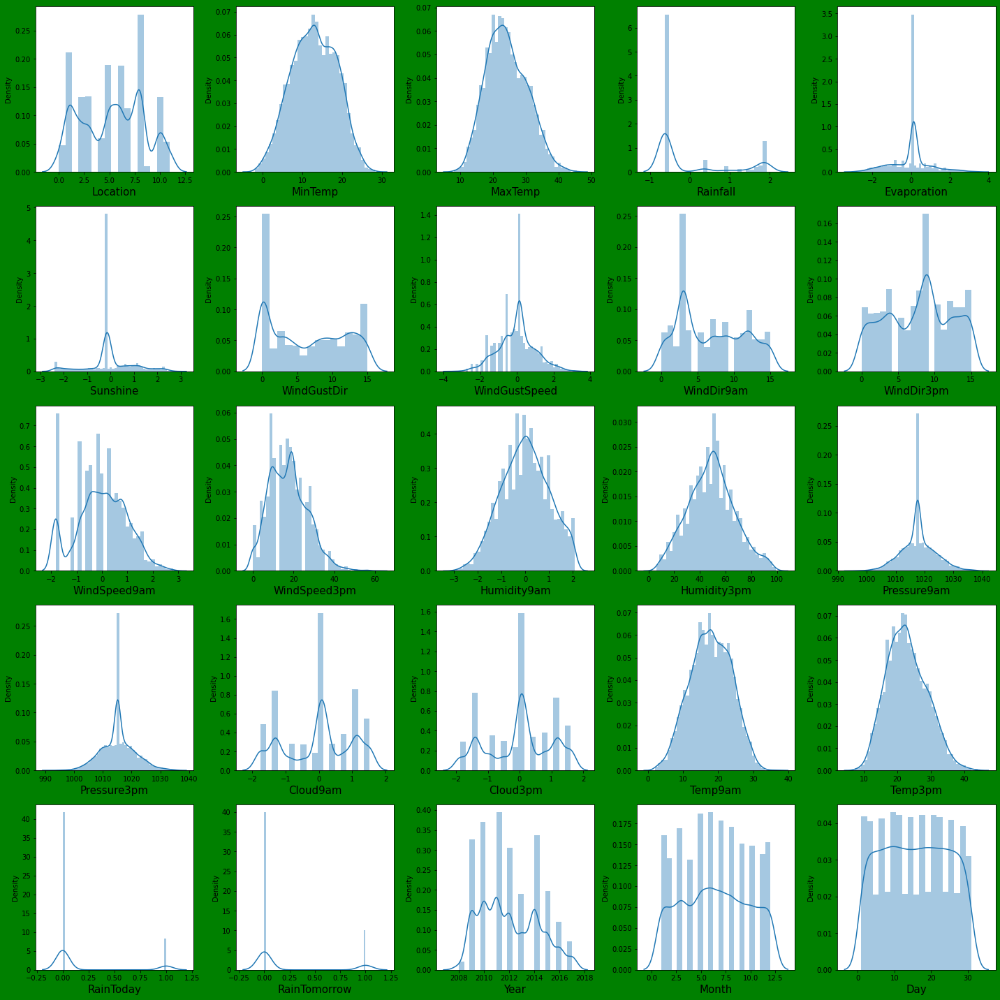

In [103]:
plt.figure(figsize=(20,20),facecolor='green')
plno=1
for x in df:
    if plno<=25:
        plt.subplot(5,5,plno)
        sns.distplot(df[x])
        plt.xlabel (x, fontsize=15)
    plno +=1
plt.tight_layout()

Overall skewness is removed.

# Checking Multicollinearity:

In [104]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif= pd.DataFrame()
vif["VIF"]= [variance_inflation_factor(df.values,i)for i in range(df.shape[1])]
vif["Features"] = df.columns
vif

,VIF,Features
0,4.683307,Location
1,57.638411,MinTemp
2,438.242891,MaxTemp
3,3.417422,Rainfall
4,1.667030,Evaporation
5,2.193900,Sunshine
6,3.921590,WindGustDir
7,2.330505,WindGustSpeed
8,4.364098,WindDir9am
9,5.708144,WindDir3pm


## Principal Component Analysis (PCA) for RainTomorrow (target1):

In [105]:
# Splitting data in target and features
x = df.drop(['RainTomorrow'], axis =1)
y = df['RainTomorrow']

In [106]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
pca = PCA()
scaler= StandardScaler()
x_scale = scaler.fit_transform(x)

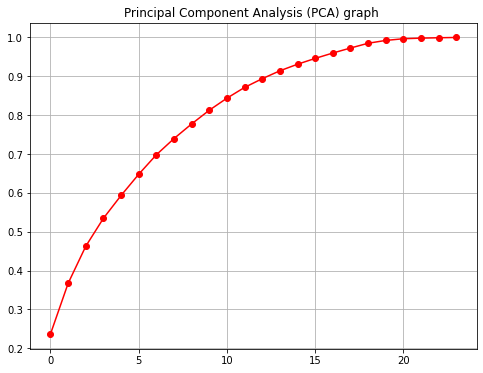

In [107]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.title('Principal Component Analysis (PCA) graph ')
plt.grid()

Here , around 100% variance gives the first 18 component. Let's take the first 18 components.

In [108]:
pca_new = PCA(n_components=18)
x_scale_new = pca_new.fit_transform(x_scale)
prin_x=pd.DataFrame(x_scale_new )
prin_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.189205,2.036963,2.427479,-2.725695,-0.521982,0.111908,1.112878,-1.850006,0.907315,-0.109152,0.144420,-0.215012,0.588413,0.913789,1.230586,0.411884,-0.494005,-0.409052
1,0.767764,-0.075667,2.237141,-2.835495,-0.888224,-0.496350,1.943559,-1.689521,0.897845,-1.111623,-0.151458,0.493350,0.135186,0.272749,-0.200424,0.487316,0.398298,0.344664
2,1.676040,0.677466,3.301720,-3.082012,-0.621017,-0.151679,0.722997,-1.551617,0.632977,0.321575,-0.227400,0.408129,-0.096303,0.182843,0.794836,-0.191729,0.301128,0.225385
3,0.767976,-1.751517,-0.003476,-1.859950,-1.892090,1.380457,0.716296,-1.573208,1.480605,0.661501,-0.783674,-1.341690,0.911940,-0.136123,0.262512,0.510176,0.057346,0.359770
4,0.901136,2.096980,-0.463288,-2.110284,-1.511532,0.720153,1.626456,-1.308760,1.348134,-1.443070,0.200182,0.758955,1.672042,0.307678,-0.582055,0.562978,-0.362635,-0.692877


### Final predictions using different Classification ML Models for RainTomorrow (target1):

### Balancing Imbalanced target feature(RainTomorrow) using SMOTE:

In [109]:
from imblearn.over_sampling import SMOTE
ovrs = SMOTE()

In [110]:
y.value_counts()

0    4894
1    1232
Name: RainTomorrow, dtype: int64

In [111]:
x_scale_new,y = ovrs.fit_resample(x_scale_new,y)
y.value_counts()

0    4894
1    4894
Name: RainTomorrow, dtype: int64

## Find best Random state:

In [112]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

from sklearn.linear_model import LogisticRegression

acc_max=0
random_max=0
for i in range(0, 500):
    x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=i)
    log= LogisticRegression()
    log.fit(x_train,y_train)
    y_pred=log.predict(x_test)
    acc= accuracy_score(y_test,y_pred)
    if acc>acc_max:
        acc_max=acc
        random_max=i
        
print('Best accuracy is', acc_max ,'on Random_state', random_max)

Best accuracy is 0.7919901920719248 on Random_state 412


In [113]:
print('Training feature shape:',x_train.shape)
print('Training target shape:',y_train.shape)
print('Test feature shape:',x_test.shape)
print('Test target shape:',y_test.shape)

Training feature shape: (7341, 18)
Training target shape: (7341,)
Test feature shape: (2447, 18)
Test target shape: (2447,)


## Using LogisticRegression():

In [114]:
from sklearn.linear_model import LogisticRegression

x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=483)

log = LogisticRegression()

log.fit(x_train, y_train)

y_pred = log.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print ('cof_mat:\n ', confusion_matrix(y_test, y_pred))
print('classification report:\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', log.score(x_train, y_train))
print('testing score : ', log.score(x_test, y_test))

accu score :  0.7752349816101348
cof_mat:
  [[956 266]
 [284 941]]
classification report:
                precision    recall  f1-score   support

           0       0.77      0.78      0.78      1222
           1       0.78      0.77      0.77      1225

    accuracy                           0.78      2447
   macro avg       0.78      0.78      0.78      2447
weighted avg       0.78      0.78      0.78      2447

-----------
-----------
training score :  0.772919220814603
testing score :  0.7752349816101348


## Use GridSearchCV for hyperparameter tuning:

In [115]:
from sklearn.model_selection import GridSearchCV
grid = dict(solver=['newton-cg', 'lbfgs', 'liblinear', 'sag'],penalty=['l2','l1','elasticnet', 'none'], C=[1.0, 0.1,0.01,0.001]
           , max_iter=[100, 140, 80])

grid_log = GridSearchCV(estimator=log, param_grid= grid, cv=5 )

grid_log.fit(x_train, y_train)
print('best params : ', grid_log.best_params_)

best params :  {'C': 0.01, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In [116]:
grid_log_best = grid_log.best_estimator_
grid_log_best.fit(x_train, y_train)

y_pred = grid_log_best.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print ('cof_mat:\n\n ', confusion_matrix(y_test, y_pred))
print('classification report:\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', grid_log_best.score(x_train, y_train))
print('testing score : ', grid_log_best.score(x_test, y_test))

accu score :  0.7744176542705353
cof_mat:

  [[937 285]
 [267 958]]
classification report:
                precision    recall  f1-score   support

           0       0.78      0.77      0.77      1222
           1       0.77      0.78      0.78      1225

    accuracy                           0.77      2447
   macro avg       0.77      0.77      0.77      2447
weighted avg       0.77      0.77      0.77      2447

-----------
-----------
training score :  0.7741452118240022
testing score :  0.7744176542705353


Accuracy score is not improved after using GridSearchCV with DecisionTreeClassifier().

But the difference between training score, testing score is decreased.

## Using DecisionTreeClassifier()

In [117]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(x_train, y_train)

y_pred = clf.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', clf.score(x_train, y_train))
print('testing score : ', clf.score(x_test, y_test))

accu score :  0.8062934205149163


cof_mat:  [[ 954  268]
 [ 206 1019]]


classification report: 

               precision    recall  f1-score   support

           0       0.82      0.78      0.80      1222
           1       0.79      0.83      0.81      1225

    accuracy                           0.81      2447
   macro avg       0.81      0.81      0.81      2447
weighted avg       0.81      0.81      0.81      2447

-----------
-----------
training score :  1.0
testing score :  0.8062934205149163


## Using GradientBoostingClassifier():

In [118]:
from sklearn.ensemble import GradientBoostingClassifier

gbdt= GradientBoostingClassifier()
gbdt.fit(x_train, y_train)

y_pred = gbdt.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', gbdt.score(x_train, y_train))
print('testing score : ', gbdt.score(x_test, y_test))

accu score :  0.8071107478545158


cof_mat:  [[977 245]
 [227 998]]


classification report: 

               precision    recall  f1-score   support

           0       0.81      0.80      0.81      1222
           1       0.80      0.81      0.81      1225

    accuracy                           0.81      2447
   macro avg       0.81      0.81      0.81      2447
weighted avg       0.81      0.81      0.81      2447

-----------
-----------
training score :  0.8472960087181582
testing score :  0.8071107478545158


### Using Gridsearch CV:

In [119]:
param= {"min_samples_split" : [2,3],"learning_rate": [0.1,0.01,1.0], 
        "min_samples_leaf" :[1,2], "criterion":['friedman_mse', 'squared_error'] }

grid_gbdt= GridSearchCV (gbdt, param_grid= param,cv=5)

grid_gbdt.fit(x_train, y_train)
print('best params : ', grid_gbdt.best_params_)

best params :  {'criterion': 'squared_error', 'learning_rate': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [120]:
grid_gbdt_best = grid_gbdt.best_estimator_
grid_gbdt_best.fit(x_train, y_train)

y_pred = grid_gbdt_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report:\n\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_gbdt_best.score(x_train, y_train))
print('testing score : ', grid_gbdt_best.score(x_test, y_test))

accu score :  0.8214139762975071


cof_mat:  [[ 992  230]
 [ 207 1018]]


classification report:

                precision    recall  f1-score   support

           0       0.83      0.81      0.82      1222
           1       0.82      0.83      0.82      1225

    accuracy                           0.82      2447
   macro avg       0.82      0.82      0.82      2447
weighted avg       0.82      0.82      0.82      2447

-----------
-----------
training score :  0.959950960359624
testing score :  0.8214139762975071


Accuracy score, training score, testing score are slightly improved after using GridSearchCV with GradientBoostingClassifier()

# Using RandomForestClassifier()

In [121]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', rf.score(x_train, y_train))
print('testing score : ', rf.score(x_test, y_test))

accu score :  0.888434818144667


cof_mat:  [[1060  162]
 [ 111 1114]]


classification report:                precision    recall  f1-score   support

           0       0.91      0.87      0.89      1222
           1       0.87      0.91      0.89      1225

    accuracy                           0.89      2447
   macro avg       0.89      0.89      0.89      2447
weighted avg       0.89      0.89      0.89      2447

-----------
-----------
training score :  1.0
testing score :  0.888434818144667


### Use GridSearchCV for hyperparameter tuning:

In [122]:
params = {'n_estimators' : [100,80, 150], 'min_samples_leaf': [1,2,3],
          'criterion' : ["gini", "entropy"]}

rf_grd = GridSearchCV(rf, param_grid = params, cv=5)

rf_grd.fit(x_train, y_train)
print('best params : ', rf_grd.best_params_)

best params :  {'criterion': 'gini', 'min_samples_leaf': 1, 'n_estimators': 150}


In [123]:
grid_rf_best = rf_grd.best_estimator_

grid_rf_best.fit(x_train, y_train)

y_pred = grid_rf_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_rf_best.score(x_train, y_train))
print('testing score : ', grid_rf_best.score(x_test, y_test))

accu score :  0.890069472823866


cof_mat:  [[1056  166]
 [ 103 1122]]


classification report: 
               precision    recall  f1-score   support

           0       0.91      0.86      0.89      1222
           1       0.87      0.92      0.89      1225

    accuracy                           0.89      2447
   macro avg       0.89      0.89      0.89      2447
weighted avg       0.89      0.89      0.89      2447

-----------
-----------
training score :  1.0
testing score :  0.890069472823866


Accuracy score is slightly improved after using GridSearchCV with RandomForestClassifier()

## ExtraTreesClassifier():

In [124]:
from sklearn.ensemble import ExtraTreesClassifier

etc =ExtraTreesClassifier()
etc.fit(x_train, y_train)

y_pred = etc.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', etc.score(x_train, y_train))
print('testing score : ', etc.score(x_test, y_test))

accu score :  0.9092766653044544


cof_mat:  [[1088  134]
 [  88 1137]]


classification report:                precision    recall  f1-score   support

           0       0.93      0.89      0.91      1222
           1       0.89      0.93      0.91      1225

    accuracy                           0.91      2447
   macro avg       0.91      0.91      0.91      2447
weighted avg       0.91      0.91      0.91      2447

-----------
-----------
training score :  1.0
testing score :  0.9092766653044544


## Use GridSearchCV for hyperparameter tuning:

In [125]:
params = {'n_estimators' : [100,80, 150], 'min_samples_leaf': [1,2],
          'criterion' : ["gini", "entropy"]}

etc_grd = GridSearchCV(etc, param_grid = params, cv=5)

etc_grd.fit(x_train, y_train)
print('best params : ', etc_grd.best_params_)

best params :  {'criterion': 'entropy', 'min_samples_leaf': 1, 'n_estimators': 80}


In [126]:
grid_etc_best = etc_grd.best_estimator_
grid_etc_best.fit(x_train, y_train)

y_pred = grid_etc_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_etc_best.score(x_train, y_train))
print('testing score : ', grid_etc_best.score(x_test, y_test))

accu score :  0.9125459746628525


cof_mat:  [[1091  131]
 [  83 1142]]


classification report: 
               precision    recall  f1-score   support

           0       0.93      0.89      0.91      1222
           1       0.90      0.93      0.91      1225

    accuracy                           0.91      2447
   macro avg       0.91      0.91      0.91      2447
weighted avg       0.91      0.91      0.91      2447

-----------
-----------
training score :  1.0
testing score :  0.9125459746628525


Accuracy score is slightly improved after using GridSearchCV with ExtraTreesClassifier()

## Using AdaBoostClassifier:

In [127]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier()
ada.fit(x_train, y_train)

y_pred = ada.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', ada.score(x_train, y_train))
print('testing score : ', ada.score(x_test, y_test))

accu score :  0.769922353902738


cof_mat:  [[957 265]
 [298 927]]


classification report:                precision    recall  f1-score   support

           0       0.76      0.78      0.77      1222
           1       0.78      0.76      0.77      1225

    accuracy                           0.77      2447
   macro avg       0.77      0.77      0.77      2447
weighted avg       0.77      0.77      0.77      2447

-----------
-----------
training score :  0.7862689006947282
testing score :  0.769922353902738


### Using GridSearchCV for hyperparameter tuning:

In [128]:
params = {'n_estimators' : [50,40, 60, 45], 'learning_rate': [1,0.1,0.01, 0.001] }

ada_grd = GridSearchCV(ada, param_grid = params, cv=5)

ada_grd.fit(x_train, y_train)
print('best params : ', ada_grd.best_params_)

best params :  {'learning_rate': 1, 'n_estimators': 60}


In [129]:
grid_ada_best = ada_grd.best_estimator_
grid_ada_best.fit(x_train, y_train)

y_pred = grid_ada_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_ada_best.score(x_train, y_train))
print('testing score : ', grid_ada_best.score(x_test, y_test))

accu score :  0.7727829995913363


cof_mat:  [[957 265]
 [291 934]]


classification report: 
               precision    recall  f1-score   support

           0       0.77      0.78      0.77      1222
           1       0.78      0.76      0.77      1225

    accuracy                           0.77      2447
   macro avg       0.77      0.77      0.77      2447
weighted avg       0.77      0.77      0.77      2447

-----------
-----------
training score :  0.7936248467511239
testing score :  0.7727829995913363


### Accuracy score is not improved after using GridSearchCV with AdaBoostClassifier().

# Using SVC('rbf'):

In [130]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

def svmkernel(ker):
    #svc = SVC(kernel = ker )
    pipe = Pipeline([('PCA', PCA()),
                ('SVM', SVC(C=7, gamma=0.01, kernel = ker))])
    
    pipe.fit(x_train, y_train)
    pipe.score(x_train, y_train)
    predsvc = pipe.predict(x_test)
    print('accu score : ', accuracy_score(y_test, predsvc))
    print("\n")
    print ('cof_mat: ', confusion_matrix(y_test, predsvc))
    print("\n")
    print('classification report: \n\n', classification_report(y_test, predsvc))
    
    print("-----------")
    print("-----------")
    
    
    print('training score : ', pipe.score(x_train, y_train))
    print('testing score : ', pipe.score(x_test, y_test))

In [131]:
svmkernel('rbf')

accu score :  0.8197793216183081


cof_mat:  [[ 967  255]
 [ 186 1039]]


classification report: 

               precision    recall  f1-score   support

           0       0.84      0.79      0.81      1222
           1       0.80      0.85      0.82      1225

    accuracy                           0.82      2447
   macro avg       0.82      0.82      0.82      2447
weighted avg       0.82      0.82      0.82      2447

-----------
-----------
training score :  0.840484947554829
testing score :  0.8197793216183081


## Using SVC ('linear'):

In [132]:
svmkernel('linear')

accu score :  0.7744176542705353


cof_mat:  [[942 280]
 [272 953]]


classification report: 

               precision    recall  f1-score   support

           0       0.78      0.77      0.77      1222
           1       0.77      0.78      0.78      1225

    accuracy                           0.77      2447
   macro avg       0.77      0.77      0.77      2447
weighted avg       0.77      0.77      0.77      2447

-----------
-----------
training score :  0.7742814330472688
testing score :  0.7744176542705353


## Using SVC ('poly'):

In [133]:
svmkernel('poly')

accu score :  0.7936248467511239


cof_mat:  [[983 239]
 [266 959]]


classification report: 

               precision    recall  f1-score   support

           0       0.79      0.80      0.80      1222
           1       0.80      0.78      0.79      1225

    accuracy                           0.79      2447
   macro avg       0.79      0.79      0.79      2447
weighted avg       0.79      0.79      0.79      2447

-----------
-----------
training score :  0.8022067838169187
testing score :  0.7936248467511239


### SVC('rbf') is better than two others. let's take it for further process.

###### Here, Extratreeclassifier() gives the best accuracy score. Let's check cv with the hyper tunned model of respective ML model.

## Cross Validtion:

In [134]:
from sklearn.model_selection import cross_val_score
svm_best = Pipeline([('PCA', PCA()),
                ('SVM', SVC(C=7, gamma=0.01, kernel = "rbf"))])

all_models = [grid_log_best, clf, grid_gbdt_best, grid_rf_best, grid_etc_best, grid_ada_best, svm_best ]

for i in all_models:
    cvscore = cross_val_score(i, x_scale_new,y, cv =7)
    print('Cross Validation Score of :',i)
    print("\n Cross Validation Score : " ,cvscore)
    print("\nMean CV Score :",cvscore.mean())
    print("\nStd deviation :",cvscore.std())
    print("\n-----------")
    print("-----------")

Cross Validation Score of : LogisticRegression(C=0.01, solver='liblinear')

 Cross Validation Score :  [0.73338099 0.70264475 0.70600858 0.63090129 0.71173104 0.82618026
 0.81473534]

Mean CV Score : 0.7322260345664555

Std deviation : 0.06311629980582274

-----------
-----------
Cross Validation Score of : DecisionTreeClassifier()

 Cross Validation Score :  [0.67476769 0.71050751 0.72889843 0.70529328 0.76752504 0.8490701
 0.81759657]

Mean CV Score : 0.7505226573475813

Std deviation : 0.05898295180268367

-----------
-----------
Cross Validation Score of : GradientBoostingClassifier(criterion='squared_error', learning_rate=1.0)

 Cross Validation Score :  [0.69764117 0.6926376  0.70815451 0.70171674 0.75965665 0.83762518
 0.82474964]

Mean CV Score : 0.7460259269598865

Std deviation : 0.057771211081137606

-----------
-----------
Cross Validation Score of : RandomForestClassifier(n_estimators=150)

 Cross Validation Score :  [0.80557541 0.80557541 0.78111588 0.75679542 0.82689557 

Among 7 classification models ExtraTreesClassifier() gives good accuracy and maximum f1 score along with a good Cross-validation score.

# Let's plot AUC-ROC Curve.

In [135]:
grid_log_best.fit(x_train, y_train)
clf.fit(x_train, y_train)
grid_gbdt_best.fit(x_train, y_train)
grid_rf_best.fit(x_train, y_train)
grid_etc_best.fit(x_train, y_train)
grid_ada_best.fit(x_train, y_train)
svm_best.fit(x_train, y_train)
print ("All model are trained")

All model are trained


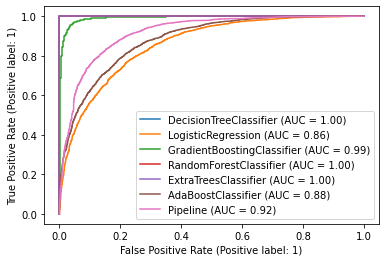

In [136]:
from sklearn.metrics import plot_roc_curve

disp = plot_roc_curve(clf, x_train, y_train)

plot_roc_curve(grid_log_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_gbdt_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_rf_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_etc_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_ada_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(svm_best, x_train, y_train, ax=disp.ax_)

plt.legend(prop = {'size':10}, loc='lower right')
plt.show()

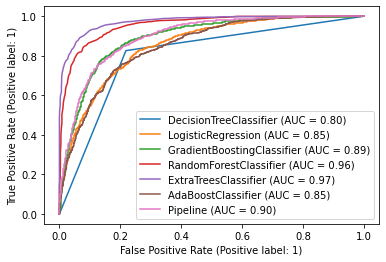

In [137]:
from sklearn.metrics import plot_roc_curve

disp = plot_roc_curve(clf, x_test, y_test)

plot_roc_curve(grid_log_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_gbdt_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_rf_best,x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_etc_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_ada_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svm_best,x_test, y_test, ax=disp.ax_)

plt.legend(prop = {'size':10}, loc='lower right')
plt.show()

###### Here ExtraTreesClassifier gives best AUC score for training and testing dataset. So it is the final model for this dataset.

In [138]:
grid_etc_best.fit(x_train, y_train)
y_pred = grid_etc_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_etc_best.score(x_train, y_train))
print('testing score : ', grid_etc_best.score(x_test, y_test))

accu score :  0.910093992644054


cof_mat:  [[1083  139]
 [  81 1144]]


classification report: 
               precision    recall  f1-score   support

           0       0.93      0.89      0.91      1222
           1       0.89      0.93      0.91      1225

    accuracy                           0.91      2447
   macro avg       0.91      0.91      0.91      2447
weighted avg       0.91      0.91      0.91      2447

-----------
-----------
training score :  1.0
testing score :  0.910093992644054


## confusion matrix

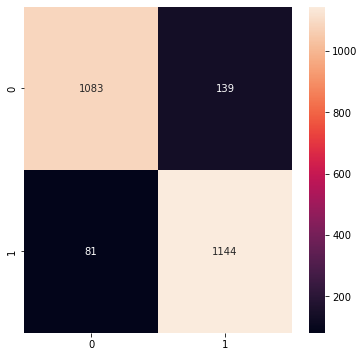

In [139]:
conf = confusion_matrix (y_test, y_pred)

fig , ax = plt.subplots(figsize=(6,6))
sns.heatmap(conf, annot = True, fmt = ".0f")
plt.show()

## Load the model:

In [140]:
import pickle
pickle.dump(grid_etc_best, open("Raining_Tomorrow_Classification_model", "wb"))
load_Raining_Tomorrow_Classification_model= pickle.load(open("Raining_Tomorrow_Classification_model", "rb"))

In [141]:
y_pred = load_Raining_Tomorrow_Classification_model.predict(x_test)

y_test = np.array(y_test)
data_prediction_by_model = pd.DataFrame()
data_prediction_by_model["Predicted Values"] = y_pred
data_prediction_by_model["Actual Values"] = y_test
data_prediction_by_model.sample(n=6)

,Predicted Values,Actual Values
792,0,0
1192,0,0
1386,1,1
1526,0,0
1945,1,1
2374,1,1


## For Rainfall:

### Principal Component Analysis (PCA) for Rainfall (target2):

In [142]:
# Splitting data in target and features
x = df.drop(['Rainfall'], axis =1)
y = df['Rainfall']

In [143]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
pca = PCA()
scaler= StandardScaler()
x_scale = scaler.fit_transform(x)

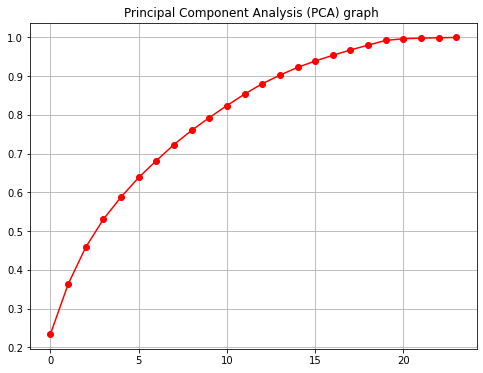

In [144]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.title('Principal Component Analysis (PCA) graph ')
plt.grid()

###### Here , around 100% variance gives the first 18 component. Let's take the first 18 components.

In [145]:
pca_new = PCA(n_components=18)
x_scale_new = pca_new.fit_transform(x_scale)
prin_x=pd.DataFrame(x_scale_new )
prin_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.435762,1.459623,2.562370,-2.778028,-0.499228,0.957394,-1.155366,-1.923893,0.381568,0.089247,0.267249,-0.942887,-0.359607,0.095717,0.697357,-1.097490,0.483385,-0.657008
1,0.717143,-0.045736,2.242283,-2.795321,-0.544311,1.904476,-1.471820,-1.744768,-0.155274,0.833078,0.112038,0.376699,-0.368870,0.061771,0.271951,0.256133,0.487233,0.386177
2,1.650929,0.626427,3.331033,-3.053623,-0.467896,0.700654,-0.550824,-1.571872,0.597713,-0.072962,0.264535,0.065703,-0.444736,-0.241196,0.055848,-0.777360,-0.074593,0.320256
3,0.683974,-1.685431,-0.045410,-1.778169,-2.478854,0.529791,-0.976829,-1.627544,1.310016,-0.492705,0.826594,-0.419616,1.079623,0.897870,-0.044647,-0.190564,0.520663,0.027498
4,1.190436,1.490426,-0.332338,-2.168409,-1.626644,1.333847,-1.961185,-1.430975,-0.125643,1.237628,0.245496,-0.479126,-1.169078,1.342649,0.411718,0.645685,0.444882,-0.471203


## Final predictions using different Regression ML Models for Rainfall (target2):

## Find best Random state:

In [146]:
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

r2_max=0
random_max=0
for i in range(1000,3000):
    x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=i)
    lin_reg= LinearRegression()
    
    lin_reg.fit(x_train,y_train)
    y_pred=lin_reg.predict(x_test)
    r2 = r2_score(y_test,y_pred)
    
    if r2>r2_max:
        r2_max=r2
        random_max=i
print('Best accuracy is', r2_max ,'on Random_state', random_max)

Best accuracy is 0.7556851655180469 on Random_state 2924


In [147]:
print('Training feature shape:',x_train.shape)
print('Training target shape:',y_train.shape)
print('Test feature shape:',x_test.shape)
print('Test target shape:',y_test.shape)

Training feature shape: (4594, 18)
Training target shape: (4594,)
Test feature shape: (1532, 18)
Test target shape: (1532,)


#### For random state=1984, the accuracy score is best. Lets take this random state for further steps.

## Using LinearRegression()

In [148]:
x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=1984)

lin_reg= LinearRegression()

lin_reg.fit(x_train, y_train)

y_pred = lin_reg.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6490636442577404
Mean absolute error: 0.37282342209215796
Mean square error: 0.34174541365833083
Root mean square error: 0.5845899534360224


## Using GridSearchCV:

In [149]:
from sklearn.model_selection import GridSearchCV

grid = dict(fit_intercept=['True', 'False'], n_jobs=[1,-1])

grid_lin = GridSearchCV(estimator=lin_reg, param_grid= grid, cv=9)

grid_lin.fit(x_train, y_train)
grid_lin.best_params_

{'fit_intercept': 'True', 'n_jobs': 1}

In [150]:
grid_lin_best = LinearRegression(fit_intercept= 'True', n_jobs= 1)

grid_lin_best.fit(x_train, y_train)
y_pred = grid_lin_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6490636442577404
Mean absolute error: 0.37282342209215796
Mean square error: 0.34174541365833083
Root mean square error: 0.5845899534360224


#### No such improvement seen after GridSearchCV.

## Using DecisionTreeRegressor():

In [151]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.26424515168530993
Mean absolute error: 0.4208618870232343
Mean square error: 0.7164855988106674
Root mean square error: 0.8464547234262843


## Using GridSearchCV:

In [152]:
param = {'criterion' : ["squared_error", "friedman_mse", "absolute_error"],
    'min_samples_split' : range(1,4),
    'splitter' : ["best", "random"]}

grid_search = GridSearchCV(estimator = dt,cv=5,param_grid = param)
grid_search.fit(x_train, y_train)

print("Best Parameters:" , grid_search.best_params_)

Best Parameters: {'criterion': 'friedman_mse', 'min_samples_split': 3, 'splitter': 'random'}


In [153]:
grid_dt_best = grid_search.best_estimator_
grid_dt_best.fit(x_train, y_train)

y_pred = grid_dt_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.2928424717340793
Mean absolute error: 0.41632795982497395
Mean square error: 0.6886372359674514
Root mean square error: 0.8298416933171359


#### After using Gridsearch CV, R2 is not improved.

## Using KNeighborsRegressor():

In [154]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn import neighbors
rmse_val = []
for i in range(0,20):
    i = i+1
    knn = neighbors.KNeighborsRegressor(n_neighbors = i)

    knn.fit(x_train,y_train) 
    y_pred=knn.predict(x_test) 
    error =np. sqrt(mean_squared_error(y_test,y_pred)) 
    rmse_val.append(error) 
    print('RMSE value for k= ' , i , 'is:', error)

RMSE value for k=  1 is: 0.7770278299609463
RMSE value for k=  2 is: 0.6752018151842857
RMSE value for k=  3 is: 0.6338796964782856
RMSE value for k=  4 is: 0.6251609211916731
RMSE value for k=  5 is: 0.6178599128124056
RMSE value for k=  6 is: 0.6157569122627125
RMSE value for k=  7 is: 0.6193770032614204
RMSE value for k=  8 is: 0.6220458436914171
RMSE value for k=  9 is: 0.6215841239692229
RMSE value for k=  10 is: 0.6191954609871241
RMSE value for k=  11 is: 0.6174061248602539
RMSE value for k=  12 is: 0.6179597479212176
RMSE value for k=  13 is: 0.6174212502712776
RMSE value for k=  14 is: 0.6157219405853555
RMSE value for k=  15 is: 0.6150730355795171
RMSE value for k=  16 is: 0.615564131321521
RMSE value for k=  17 is: 0.6159862523152707
RMSE value for k=  18 is: 0.6158818086730212
RMSE value for k=  19 is: 0.6145656007518208
RMSE value for k=  20 is: 0.6155970254754897


In [155]:
min(rmse_val)

0.6145656007518208

### For k=7 we get the best RMSE value for KNeighborsRegressor()

In [156]:
knn =KNeighborsRegressor(n_neighbors= 7)
knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6060547938917494
Mean absolute error: 0.36508619497421
Mean square error: 0.3836278721690976
Root mean square error: 0.6193770032614204


#### Using GridSearchCV

In [157]:
param = {'algorithm' : ['auto', 'ball_tree', 'kd_tree'],
             'leaf_size' : [30,40,25,34],
             'n_neighbors' : [7],'weights': ['uniform', 'distance'], 'p':[1,2,3]}
    

gridsearchknn = GridSearchCV(estimator = knn, param_grid=param, cv=5)

gridsearchknn.fit(x_train, y_train) 

print("Best Parameters:" , gridsearchknn.best_params_)

Best Parameters: {'algorithm': 'auto', 'leaf_size': 30, 'n_neighbors': 7, 'p': 3, 'weights': 'distance'}


In [158]:
grid_knn_best = gridsearchknn.best_estimator_

grid_knn_best.fit(x_train, y_train)

y_pred = grid_knn_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6106556286547906
Mean absolute error: 0.36439922477997094
Mean square error: 0.3791475322056202
Root mean square error: 0.6157495693913396


#### R2 Score and RMSE are slightly improved after GridSearchCV.

## Using RandomForestRegressor():

In [159]:
from sklearn.ensemble import RandomForestRegressor

rf= RandomForestRegressor()
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6433302794798439
Mean absolute error: 0.3793442338212496
Mean square error: 0.3473286229372104
Root mean square error: 0.5893459280738355


#### Using GridSearchCV:

In [ ]:
params = {'n_estimators' : [100,110,80], 'criterion' : ["squared_error", "absolute_error"]}

rf_grd = GridSearchCV(rf, param_grid = params, cv=5)
rf_grd.fit(x_train, y_train)
print('best params : ', rf_grd.best_params_)

In [ ]:
grid_rf_best = rf_grd.best_estimator_

grid_rf_best.fit(x_train, y_train)

y_pred = grid_rf_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

#### r2 score, RMSE are not improved after GridSearchCV.

## Using Support Vector Regression():

In [160]:
from sklearn.svm import SVR
svr_rbf = SVR(kernel='rbf')
svr_rbf.fit(x_train, y_train)

y_pred = svr_rbf.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))

R2 Score: 0.6191077594611838
Mean absolute error: 0.3135258174535298
Mean square error: 0.37091676075244384


In [161]:
from sklearn.svm import SVR
svr_poly = SVR(kernel='poly')
svr_poly.fit(x_train, y_train)

y_pred = svr_poly.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))

R2 Score: 0.5869463250400904
Mean absolute error: 0.3322150042974082
Mean square error: 0.40223589463595083


In [162]:
from sklearn.svm import SVR
svr_lin = SVR(kernel='linear', )
svr_lin.fit(x_train, y_train)

y_pred = svr_lin.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))

R2 Score: 0.5717580781727478
Mean absolute error: 0.30097437111269143
Mean square error: 0.4170263648266111


## Using GridSearchCV:

In [163]:
params = {'gamma':['scale', 'auto'],'C':[1.0,0.1], 'tol':[0.01,0.1], 'kernel':['rbf']}

svr_grd = GridSearchCV(svr_lin, param_grid = params, cv=5)
svr_grd.fit(x_train, y_train)
print('best params : ', svr_grd.best_params_)

best params :  {'C': 1.0, 'gamma': 'auto', 'kernel': 'rbf', 'tol': 0.01}


In [164]:
grid_svr_best = svr_grd.best_estimator_
grid_svr_best.fit(x_train, y_train)

y_pred = grid_svr_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6263205479566953
Mean absolute error: 0.32223024175335446
Mean square error: 0.36389287352133864
Root mean square error: 0.6032353384221938


###### r2 score, RMSE are improved after using hyperparameter..

## Using GradientBoostingRegressor()

In [165]:
from sklearn.ensemble import  GradientBoostingRegressor

gbdt= GradientBoostingRegressor()
gbdt.fit(x_train, y_train)

y_pred = gbdt.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6316047334857204
Mean absolute error: 0.3969452659813014
Mean square error: 0.3587470795905715
Root mean square error: 0.5989549896198975


### Using GridSearchCV:

In [166]:
params = {'loss': ['squared_error', 'absolute_error'], 'n_estimators':[100,150,80], 'max_features': ['auto', 'sqrt']}

gbdt_grd = GridSearchCV(gbdt, param_grid = params, cv=5)
gbdt_grd.fit(x_train, y_train)
print('best params : ', gbdt_grd.best_params_)

best params :  {'loss': 'squared_error', 'max_features': 'sqrt', 'n_estimators': 150}


In [167]:
grid_gbdt_best = gbdt_grd.best_estimator_

grid_gbdt_best.fit(x_train, y_train)

y_pred = grid_gbdt_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6370655025522646
Mean absolute error: 0.3975740630428893
Mean square error: 0.35342932680433886
Root mean square error: 0.5944992235523432


##### r2 score, RMSE are improved after GridSearchCV.

## Using AdaBoostRegressor():

In [168]:
from sklearn.ensemble import AdaBoostRegressor

ada= AdaBoostRegressor()
ada.fit(x_train, y_train)

y_pred = ada.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.2810381766810556
Mean absolute error: 0.786446834794098
Mean square error: 0.7001323792600528
Root mean square error: 0.8367391345336088


### Using GridSearchCV:

In [169]:
params = { 'loss' : ['linear', 'square'], 'learning_rate': [0.1,0.01,1] ,
        'n_estimators':[50,90,40] }

ada_grd = GridSearchCV(ada, param_grid = params, cv=5)
ada_grd.fit(x_train, y_train)
print('best params : ', ada_grd.best_params_)

best params :  {'learning_rate': 0.01, 'loss': 'square', 'n_estimators': 90}


In [170]:
grid_ada_best = ada_grd.best_estimator_

grid_ada_best.fit(x_train, y_train)

y_pred = grid_ada_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.5679453410579512
Mean absolute error: 0.49278093812745416
Mean square error: 0.42073924723718575
Root mean square error: 0.6486441607207959


##### r2 score, RMSE are improved after GridSearchCV.

### As per 7 different regression model we can see that the model with maximum R2 score and minimum RMSE value is LinearRegression().

Let's check the cross validation score before final prediction.

## Cross Validation:

In [171]:
from sklearn.model_selection import cross_val_score

all_models = [lin_reg , dt , grid_knn_best , rf , grid_svr_best , grid_gbdt_best, grid_ada_best]

for i in all_models:
    cvscore = cross_val_score(i, x_scale,y, cv = 5)
    print('Cross Validation Score of :',i)
    print("\n Cross Validation Score : " ,cvscore)
    print("\nMean CV Score :",cvscore.mean())
    print("\nStd deviation :",cvscore.std())
    print("\n-----------")
    print("-----------")

Cross Validation Score of : LinearRegression()

 Cross Validation Score :  [0.76791667 0.66848152 0.65845369 0.62432504 0.78247503]

Mean CV Score : 0.7003303923874562

Std deviation : 0.06302454870561641

-----------
-----------
Cross Validation Score of : DecisionTreeRegressor()

 Cross Validation Score :  [0.30850684 0.44632801 0.14253018 0.39459919 0.38960706]

Mean CV Score : 0.33631425575328955

Std deviation : 0.106457317513297

-----------
-----------
Cross Validation Score of : KNeighborsRegressor(n_neighbors=7, p=3, weights='distance')

 Cross Validation Score :  [0.71230639 0.64065431 0.57807333 0.57094007 0.73246572]

Mean CV Score : 0.6468879650436835

Std deviation : 0.06655150961300213

-----------
-----------
Cross Validation Score of : RandomForestRegressor()

 Cross Validation Score :  [0.72538145 0.67188973 0.60175463 0.61287874 0.77786552]

Mean CV Score : 0.6779540112963879

Std deviation : 0.06679757871043333

-----------
-----------
Cross Validation Score of : SV

Here also LinearRegression is the best model with max cv score and min std.

In [172]:
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV
#LASSO Regression

lassocv= LassoCV()
lassocv.fit(x_train, y_train)
alpha= lassocv.alpha_   #best learning rate for LASSO
alpha  

0.0009966081463275666

In [173]:
lasso_reg=Lasso(alpha)
lasso_reg.fit(x_train,y_train)
print ("Score after applying LASSO regression on the model is :", lasso_reg.score(x_test, y_test))

Score after applying LASSO regression on the model is : 0.6492822835750046


In [174]:
#RIDGE Regression

ridgecv= RidgeCV(alphas=np.arange(0.0001, 1.0, 0.001),  normalize= True, cv=10 )
ridgecv.fit(x_train, y_train)
alpha= ridgecv.alpha_   #best learning rate for RIDGE
alpha  

0.0011

In [175]:
ridge_reg=Ridge(alpha)
ridge_reg.fit(x_train,y_train)
print ("Score after applying LASSO regression on the model is :", ridge_reg.score(x_test, y_test))

Score after applying LASSO regression on the model is : 0.6490636584010259


After using LASSO() and Ridge(), there is no large change in score. So this model is not OVERFITTED.

## Conclusion:

## Our final model is LinearRegression() for this particular dataset for calculating Rainfall.

In [176]:
y_pred = lin_reg.predict(x_test)
y_pred

array([-0.3740993 , -0.28255456, -0.57537753, ..., -0.55926699,
       -0.43921089, -0.2224213 ])

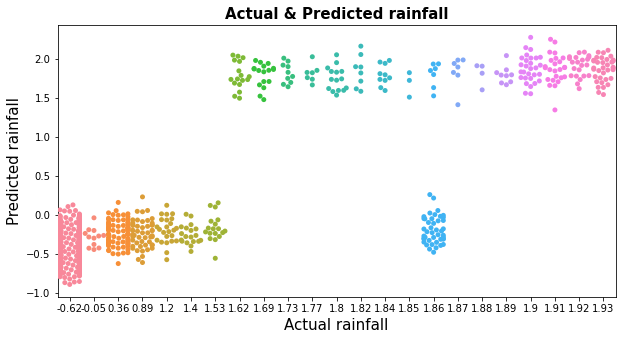

In [177]:
# Let's visualize the variation of actual test data and predicted data
plt.figure(figsize=(10,5))
sns.swarmplot(y_test.round(2), y_pred)
plt.xlabel("Actual rainfall", fontsize= 15)
plt.ylabel("Predicted rainfall",fontsize= 15)
plt.title("Actual & Predicted rainfall" , fontsize= 15, fontweight= 'bold')
plt.show()

In [178]:
print('Final R2 Score:', r2_score(y_test, y_pred))
print('\nFinal Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('\nFinal Mean square error:', mean_squared_error(y_test, y_pred))
print('\nFinal Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

Final R2 Score: 0.6490636442577404

Final Mean absolute error: 0.37282342209215796

Final Mean square error: 0.34174541365833083

Final Root mean square error: 0.5845899534360224


## Load and save the model

Now , let's save the model for future use.

In [179]:
import pickle
pickle.dump(lin_reg, open("Rainfall_Regression_model", "wb"))
load_Rainfall_Regression_model= pickle.load(open("Rainfall_Regression_model", "rb"))

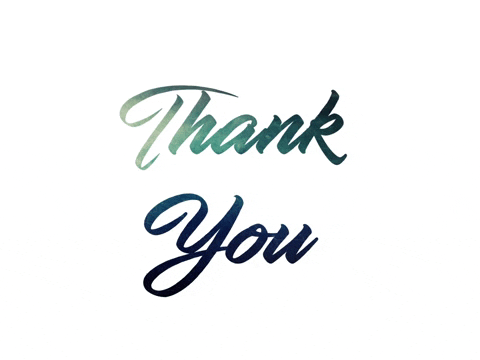